In [1]:
!pip install minisom
# # !pip install xgboost
# # !pip install seaborn
# !pip install yellowbrick

# Import libraries

In [2]:
import pandas as pd
import numpy as np
from sklearn.exceptions import UndefinedMetricWarning
from  sklearn.naive_bayes import GaussianNB

from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC

from minisom import MiniSom
from sklearn.metrics import silhouette_score

from sklearn.feature_selection import SequentialFeatureSelector
from sklearn.feature_selection import RFECV
from sklearn.model_selection import StratifiedKFold
from sklearn.pipeline import Pipeline


from sklearn.ensemble import RandomForestClassifier, VotingClassifier,GradientBoostingClassifier,StackingClassifier
import xgboost as xgb


import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objs as go


from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix,classification_report
from sklearn.metrics import accuracy_score
from sklearn.feature_selection import RFE

from yellowbrick.text import TSNEVisualizer
from sklearn.manifold import TSNE
from sklearn.utils.multiclass import unique_labels
from sklearn.feature_selection import SelectKBest, mutual_info_classif


from sklearn.decomposition import PCA

from sklearn.preprocessing import MinMaxScaler, StandardScaler

from sklearn.inspection import permutation_importance

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.utils import to_categorical 
from keras.optimizers import Adam

import warnings
warnings.filterwarnings("ignore", category=UndefinedMetricWarning)
warnings.simplefilter(action='ignore', category=FutureWarning)
warnings.filterwarnings("ignore", category=UserWarning)

# Function conf_matrix
* To preview the confusion matrix and classification report

In [3]:
def conf_matrix(x, y, title, show_report=False):
    cm = confusion_matrix(x, y)
    plt.figure(figsize=(6, 4))
    
    sns.heatmap(cm, annot=True, fmt='d', cmap="Oranges", cbar=False)
    plt.title(f'Confusion Matrix - {title} Data')
    plt.xlabel('Predicted Class')
    plt.ylabel('True Class')
    plt.show()
    if not show_report:
        print("Accuracy: ", accuracy_score(x, y))

    if show_report:
        report = classification_report(x, y)
        print("Classification Report:")
        print(report)
        plt.show()
    return accuracy_score(x, y)

# Function calculate_Accuracy
* To calculate accuracy_score

In [4]:
def calculate_Accuracy(x, y):
     return accuracy_score(x, y)

# Read Data from CSV file

In [5]:
Forest_Train=pd.read_csv("https://raw.githubusercontent.com/ahmedbadawy11/Forest-Cover-Type-Prediction/main/training_dataset.csv")
Forest_Test=pd.read_csv("https://raw.githubusercontent.com/ahmedbadawy11/Forest-Cover-Type-Prediction/main/test_dataset.csv")
Forest_validation=pd.read_csv("https://raw.githubusercontent.com/ahmedbadawy11/Forest-Cover-Type-Prediction/main/validation_dataset.csv")

In [6]:
Forest_Train.head()

,Id,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Hillshade_3pm,...,Soil_Type32,Soil_Type33,Soil_Type34,Soil_Type35,Soil_Type36,Soil_Type37,Soil_Type38,Soil_Type39,Soil_Type40,Cover_Type
0,8192,2976,85,23,95,72,2436,246,193,64,...,0,0,0,0,0,0,0,0,0,1
1,14089,3104,233,12,150,40,1503,200,251,186,...,0,0,0,0,0,0,0,0,0,1
2,10246,3385,160,7,937,204,1224,228,242,147,...,0,0,0,0,0,0,0,0,0,1
3,8686,3191,41,14,210,37,3207,221,208,119,...,1,0,0,0,0,0,0,0,0,1
4,9242,2821,297,4,85,1,992,208,238,169,...,0,0,0,0,0,0,0,0,0,1


In [7]:
Forest_Train.shape

(8286, 56)

In [8]:
Forest_Train["Id"].value_counts()

8192     1
11755    1
13396    1
10882    1
6318     1
        ..
3371     1
4590     1
4397     1
4435     1
2017     1
Name: Id, Length: 8286, dtype: int64

# Some statistic Info 

In [9]:
Forest_Train.describe()

,Id,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Hillshade_3pm,...,Soil_Type32,Soil_Type33,Soil_Type34,Soil_Type35,Soil_Type36,Soil_Type37,Soil_Type38,Soil_Type39,Soil_Type40,Cover_Type
count,8286.000000,8286.000000,8286.000000,8286.000000,8286.000000,8286.000000,8286.000000,8286.000000,8286.000000,8286.00000,...,8286.000000,8286.000000,8286.000000,8286.000000,8286.000000,8286.000000,8286.000000,8286.000000,8286.000000,8286.000000
mean,7609.998431,2732.983104,155.366643,16.868694,225.249698,53.233888,1629.840574,213.732682,218.534999,133.00712,...,0.035723,0.031620,0.001328,0.008810,0.000845,0.003259,0.063481,0.056119,0.040068,4.561550
std,4291.741503,432.906958,108.392758,8.514811,213.670866,62.890107,1259.714393,30.675904,23.142959,46.73019,...,0.185610,0.174996,0.036413,0.093453,0.029055,0.056994,0.243840,0.230165,0.196130,1.789533
min,1.000000,1863.000000,0.000000,0.000000,0.000000,-134.000000,0.000000,58.000000,99.000000,0.00000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
25%,3889.500000,2350.000000,66.000000,10.000000,60.000000,5.000000,726.000000,197.000000,206.000000,103.00000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.000000
50%,7479.500000,2720.500000,125.000000,16.000000,175.000000,34.000000,1273.000000,221.000000,222.000000,136.00000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000
75%,11349.750000,3099.750000,252.000000,23.000000,323.000000,84.000000,2155.000000,237.000000,235.000000,166.00000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000
max,15120.000000,3849.000000,360.000000,50.000000,1343.000000,547.000000,6508.000000,254.000000,254.000000,248.00000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,7.000000


In [10]:
Forest_Train.std()

Id                                    4291.741503
Elevation                              432.906958
Aspect                                 108.392758
Slope                                    8.514811
Horizontal_Distance_To_Hydrology       213.670866
Vertical_Distance_To_Hydrology          62.890107
Horizontal_Distance_To_Roadways       1259.714393
Hillshade_9am                           30.675904
Hillshade_Noon                          23.142959
Hillshade_3pm                           46.730190
Horizontal_Distance_To_Fire_Points    1053.310891
Wilderness_Area1                         0.404813
Wilderness_Area2                         0.172060
Wilderness_Area3                         0.494934
Wilderness_Area4                         0.471731
Soil_Type1                               0.156079
Soil_Type2                               0.208670
Soil_Type3                               0.254955
Soil_Type4                               0.242103
Soil_Type5                               0.107018


# check NULL

In [11]:
Forest_Train.isnull().sum()

Id                                    0
Elevation                             0
Aspect                                0
Slope                                 0
Horizontal_Distance_To_Hydrology      0
Vertical_Distance_To_Hydrology        0
Horizontal_Distance_To_Roadways       0
Hillshade_9am                         0
Hillshade_Noon                        0
Hillshade_3pm                         0
Horizontal_Distance_To_Fire_Points    0
Wilderness_Area1                      0
Wilderness_Area2                      0
Wilderness_Area3                      0
Wilderness_Area4                      0
Soil_Type1                            0
Soil_Type2                            0
Soil_Type3                            0
Soil_Type4                            0
Soil_Type5                            0
Soil_Type6                            0
Soil_Type7                            0
Soil_Type8                            0
Soil_Type9                            0
Soil_Type10                           0


# check duplicate

In [12]:
Forest_Train.duplicated().sum()

0

In [13]:
Forest_Train.dtypes

Id                                    int64
Elevation                             int64
Aspect                                int64
Slope                                 int64
Horizontal_Distance_To_Hydrology      int64
Vertical_Distance_To_Hydrology        int64
Horizontal_Distance_To_Roadways       int64
Hillshade_9am                         int64
Hillshade_Noon                        int64
Hillshade_3pm                         int64
Horizontal_Distance_To_Fire_Points    int64
Wilderness_Area1                      int64
Wilderness_Area2                      int64
Wilderness_Area3                      int64
Wilderness_Area4                      int64
Soil_Type1                            int64
Soil_Type2                            int64
Soil_Type3                            int64
Soil_Type4                            int64
Soil_Type5                            int64
Soil_Type6                            int64
Soil_Type7                            int64
Soil_Type8                      

In [14]:
Forest_Train["Cover_Type"].value_counts()

7    1720
5    1569
3    1385
4    1368
6    1036
2     861
1     347
Name: Cover_Type, dtype: int64

In [15]:
Forest_Train["Hillshade_3pm"]

0        64
1       186
2       147
3       119
4       169
       ... 
8281    175
8282    146
8283     88
8284    143
8285    157
Name: Hillshade_3pm, Length: 8286, dtype: int64

# Function Plot_pie 
* plot pie for Cover_Type column

In [16]:
def Plot_pie(Forest_data,title=None):
    Cover_Type_count=Forest_data.groupby('Cover_Type').size().reset_index()
    # Grouped data and using sum method to have count of Mortality national comparison.
    Cover_Type_count=Cover_Type_count.rename(columns = {0:'count'})
#     Cover_Type_count
    Cover_Type_count_fig=px.pie(Cover_Type_count,names='Cover_Type',values='count',title=f'Unique values of Cover Type - {title}'
                   ,color_discrete_sequence=px.colors.sequential.RdBu ,hole=0.2)
    #apply specific colors using 'color_discrete_map' to have a sequence of colors
    #and make the hole of pie using hole method.
    Cover_Type_count_fig.show()
    return Cover_Type_count

# Run Function Plot_pie  for Training set


In [17]:
Plot_pie(Forest_Train,"Training Set")

,Cover_Type,count
0,1,347
1,2,861
2,3,1385
3,4,1368
4,5,1569
5,6,1036
6,7,1720


# Run Function Plot_pie  for Test set


In [18]:
Plot_pie(Forest_Test,"Test Set")

,Cover_Type,count
0,1,197
1,2,230
2,3,195
3,4,247
4,5,215
5,6,225
6,7,216


# Run Function Plot_pie  for validation set


In [19]:
Plot_pie(Forest_validation,"validation Set")

,Cover_Type,count
0,1,224
1,2,207
2,3,233
3,4,202
4,5,201
5,6,207
6,7,224


# Function Plot_Box 
* plot Box for Numeric column

In [20]:
def Plot_Box(Forest_data):
    color_scale={'A':'rgb(255,0,127)','B':'rgb(255,153,204)','C':'rgb(51,0,25)'}

    selected_columns = Forest_data[['Elevation', 'Aspect', 'Slope','Horizontal_Distance_To_Hydrology',
                                     'Vertical_Distance_To_Hydrology', 'Horizontal_Distance_To_Roadways','Hillshade_9am', 
                                     'Hillshade_Noon', 'Hillshade_3pm','Horizontal_Distance_To_Fire_Points']]
    for i, col in enumerate(selected_columns.columns):
        fig = px.box(Forest_data,  y=col,color_discrete_map=color_scale,   notched=True)
        fig.show()

# Run  Function Plot_Box for taining Set

In [21]:
 Plot_Box(Forest_Train)

# Run  Function Plot_Box for Test Set

In [22]:
 Plot_Box(Forest_Test)

# Run  Function Plot_Box for validation Set

In [23]:
 Plot_Box(Forest_validation)

# Function Plot_distribution 
* plot distribution  for Numeric column

In [24]:
def Plot_distribution(Forest_data):
    selected_columns = Forest_data[['Elevation', 'Aspect', 'Slope', 'Horizontal_Distance_To_Hydrology',
                                 'Vertical_Distance_To_Hydrology', 'Horizontal_Distance_To_Roadways',
                                 'Hillshade_9am', 'Hillshade_Noon', 'Hillshade_3pm',
                                 'Horizontal_Distance_To_Fire_Points']]

    sns.set(style='whitegrid')

    num_cols = 3
    num_rows = (len(selected_columns.columns) + num_cols - 1) // num_cols


    fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 15))


    axes = axes.flatten()


    for i, col in enumerate(selected_columns.columns):
        sns.distplot(selected_columns[col], ax=axes[i])
        axes[i].set_xlabel(col, fontsize=12)
        axes[i].set_ylabel('Density', fontsize=12)
        axes[i].set_title(f'Distribution of {col}', fontsize=14)


    for j in range(len(selected_columns.columns), len(axes)):
        axes[j].axis('off')

    plt.tight_layout()


    plt.show()


# Run Function Plot_distribution  for Training set

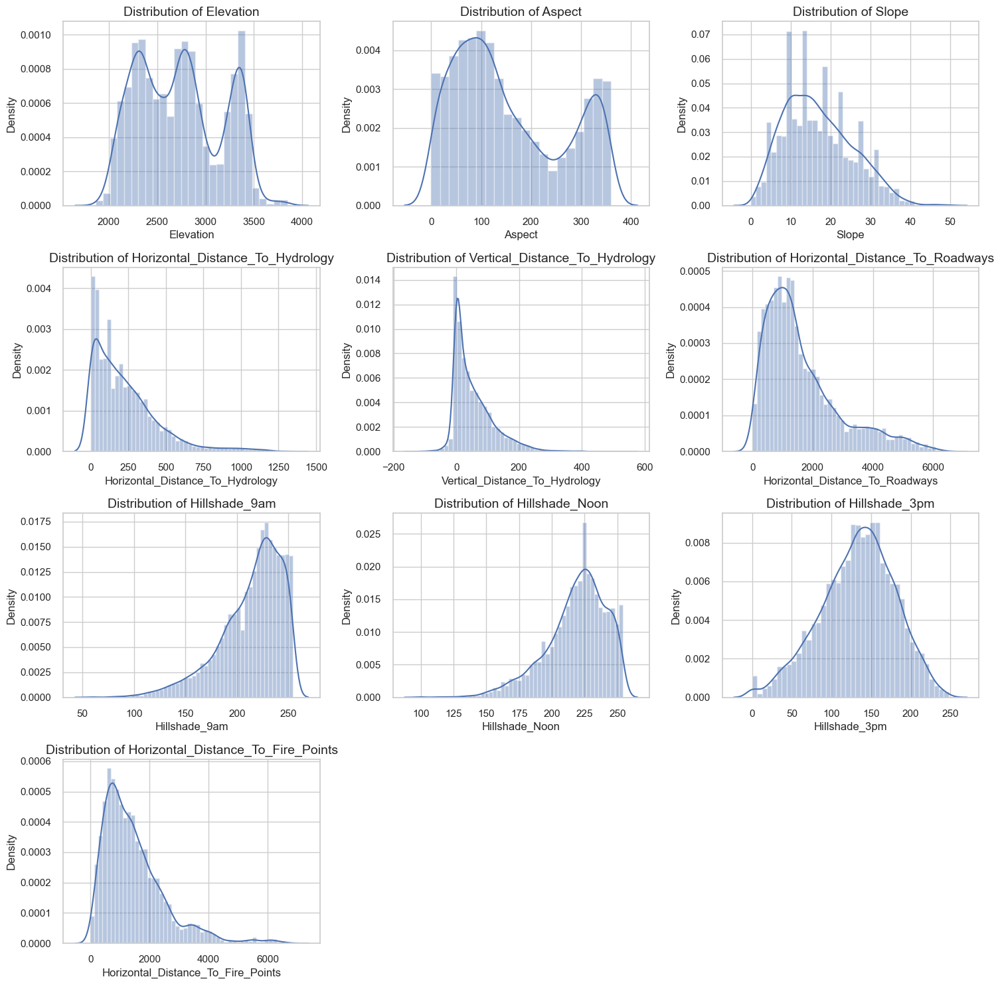

In [25]:
Plot_distribution(Forest_Train)

# Run Function Plot_distribution  for test set

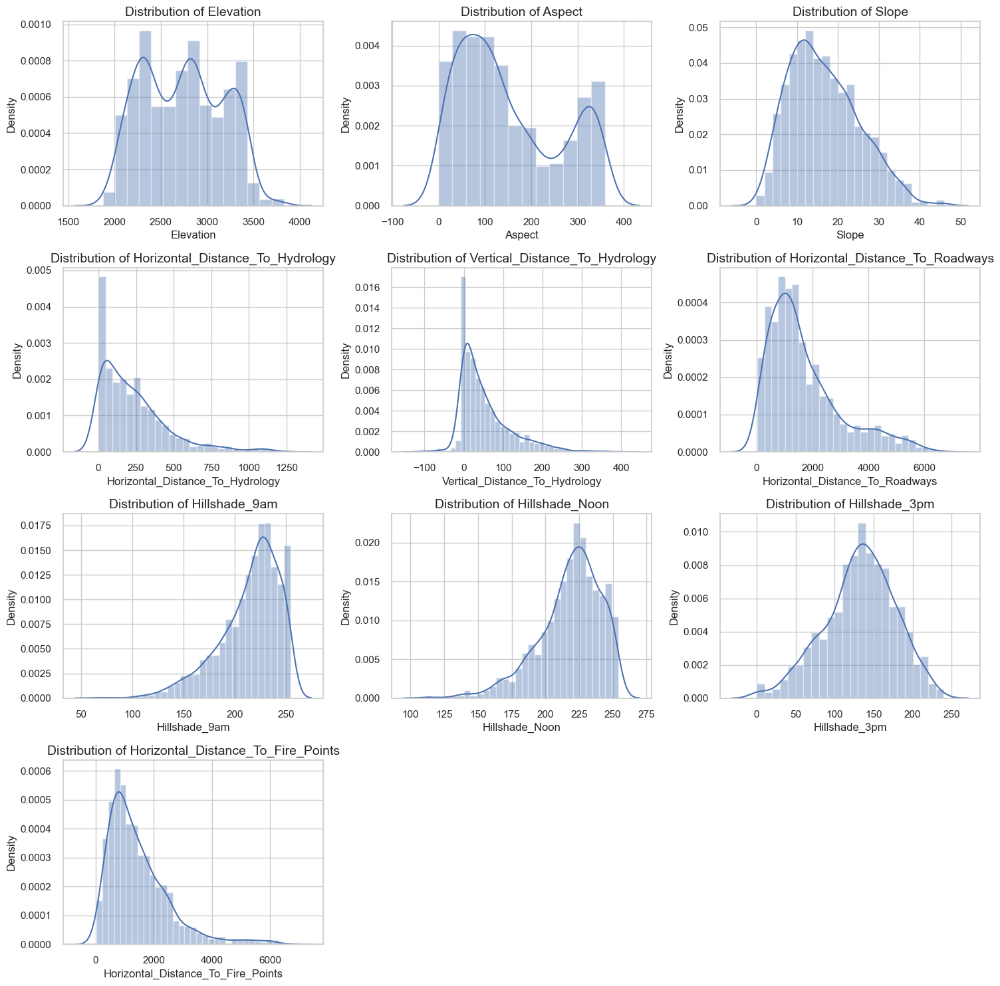

In [26]:
Plot_distribution(Forest_Test)

# Run Function Plot_distribution  for validation set

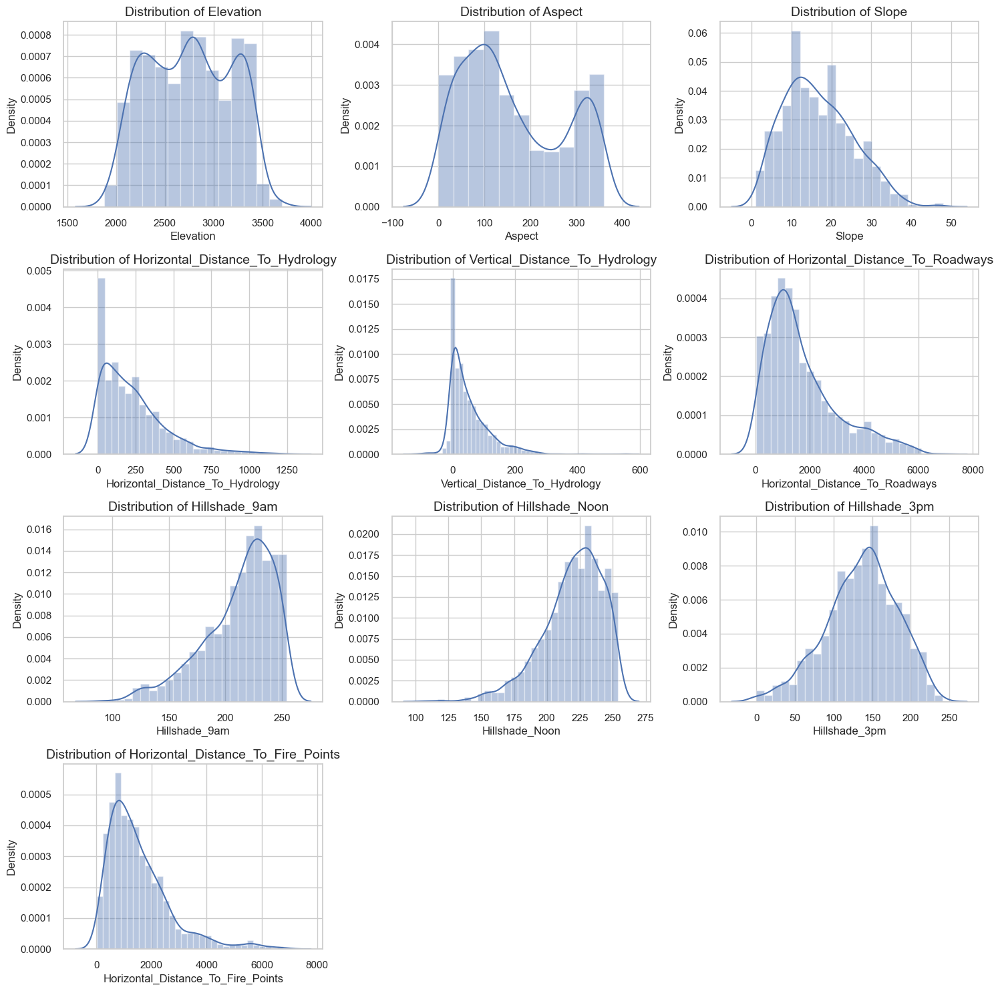

In [27]:
Plot_distribution(Forest_validation)

# Function plot_pairplot 
* plot pairplot  for Numeric column

In [28]:
def plot_pairplot(Forest_data):
    sns.set(style='ticks', font_scale=1.2)

    pair_plot = sns.pairplot(data=Forest_data,
                            hue='Cover_Type',
                            vars=['Aspect', 'Slope', 'Hillshade_9am', 'Horizontal_Distance_To_Roadways',
                                  'Horizontal_Distance_To_Hydrology', 'Horizontal_Distance_To_Fire_Points'],

    #                          kind='reg'
                            diag_kind="kde"
                            )

    # pair_plot.map_upper(sns.kdeplot)
    pair_plot.fig.suptitle("Pair Plot of Selected Features by Cover Type", y=1.02, fontsize=16)
    plt.subplots_adjust(top=0.9)

    plt.show()

# Run Function plot_pairplot for trainig set


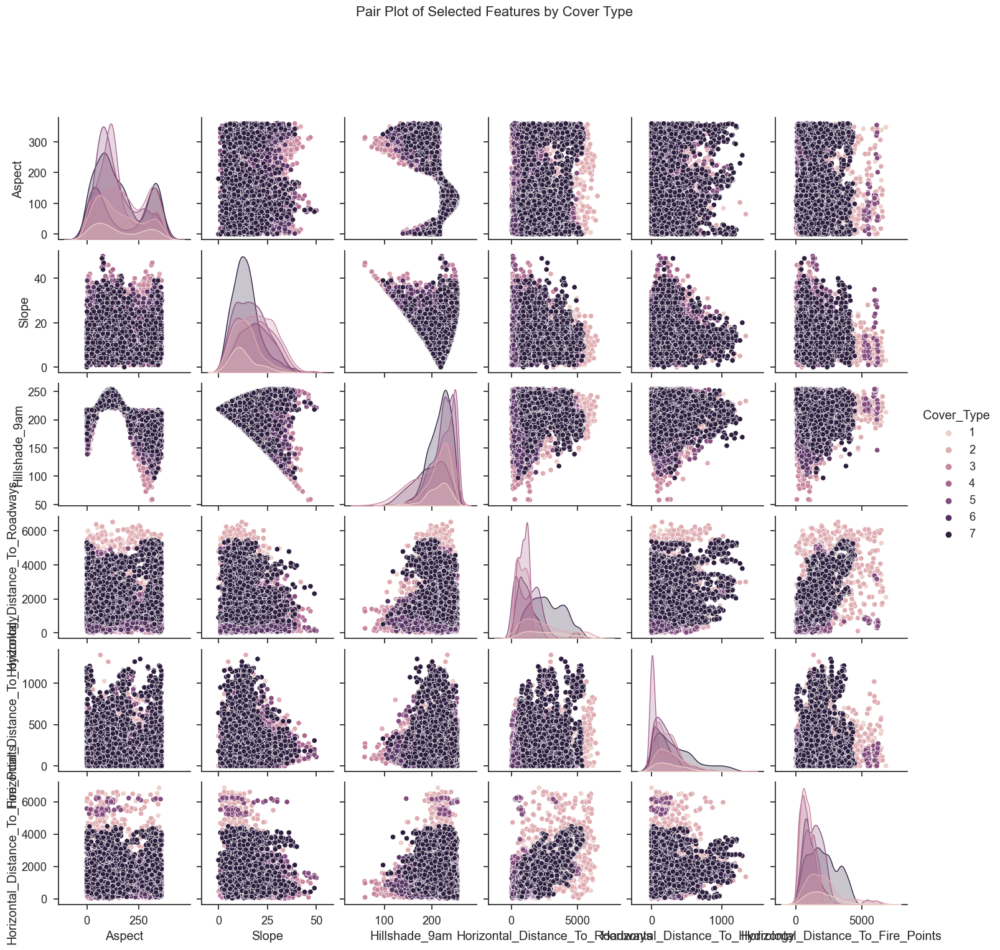

In [29]:
plot_pairplot(Forest_Train)

# Run Function plot_pairplot for test set


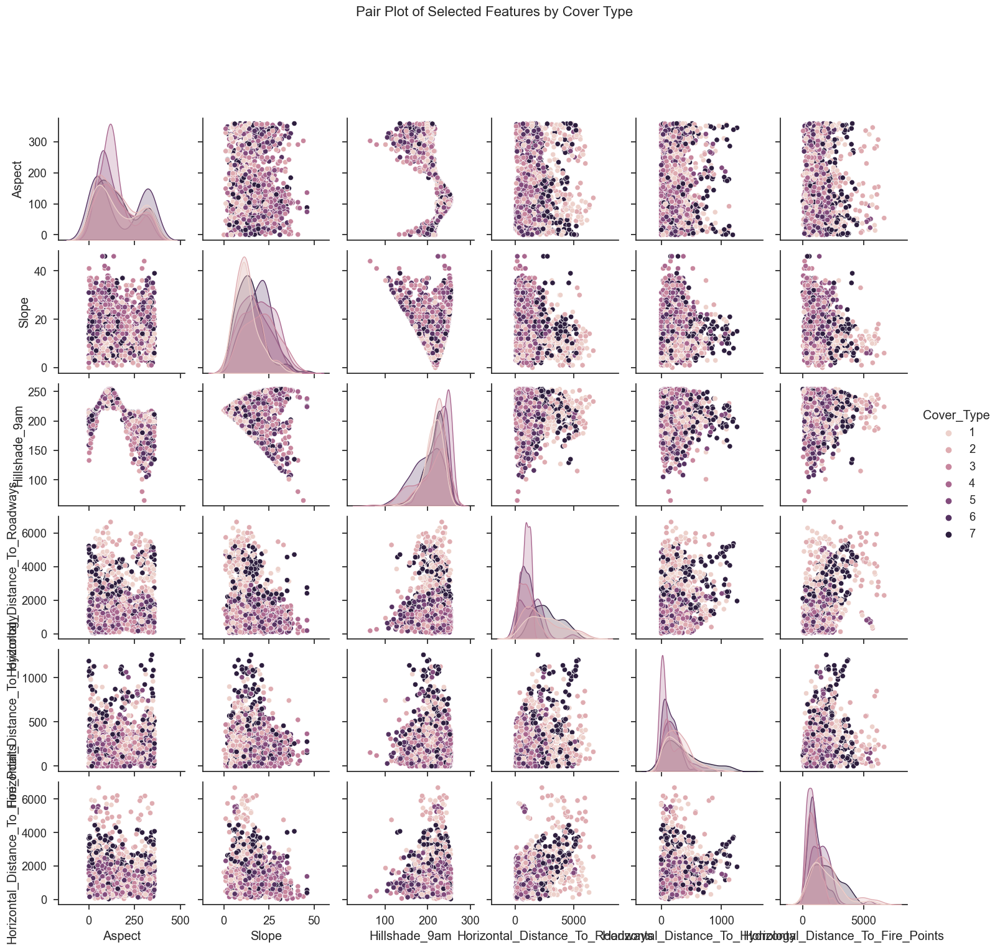

In [30]:
plot_pairplot(Forest_Test)

# Run Function plot_pairplot for Validation set


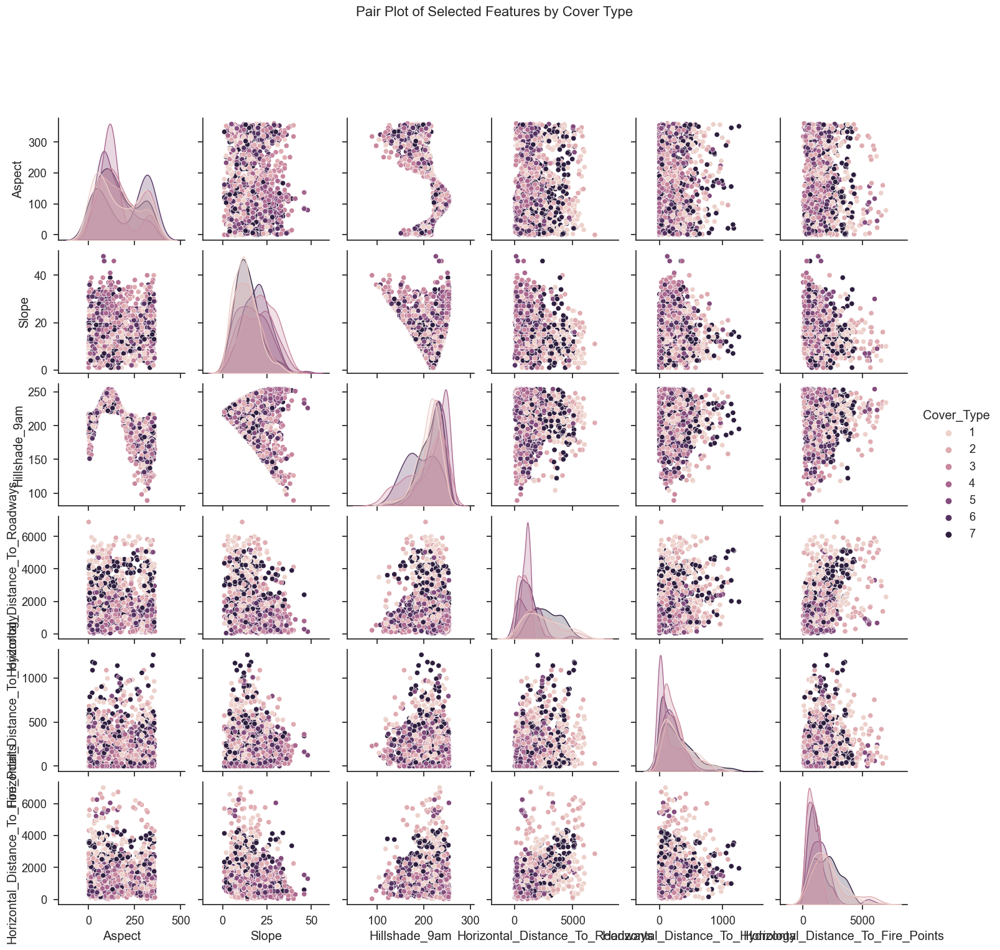

In [31]:
plot_pairplot(Forest_validation)

# Draw Correlation Heatmap

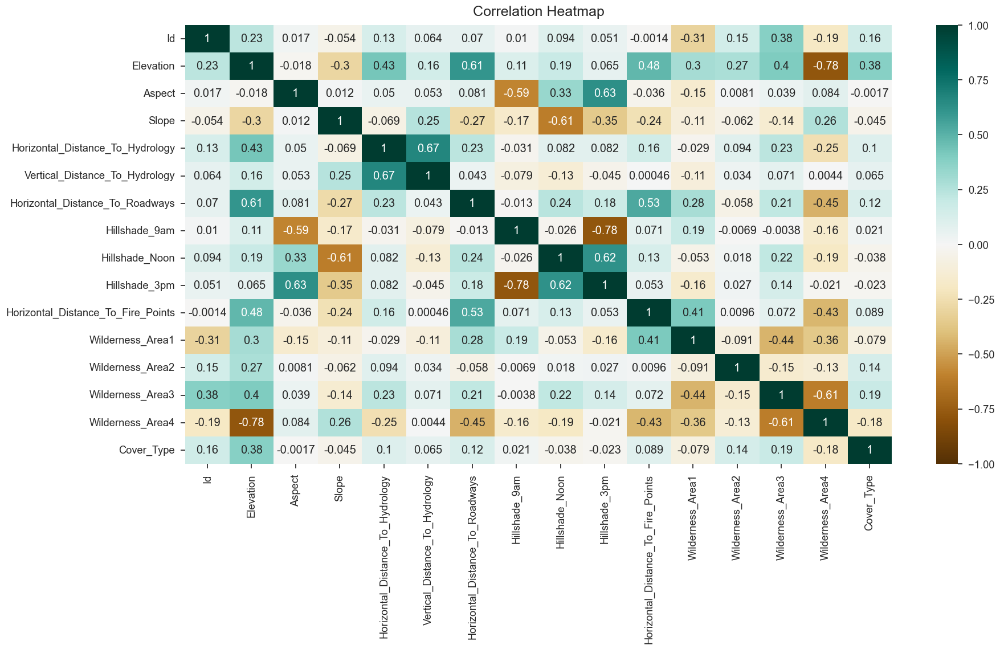

In [32]:
col_list = Forest_Train.columns
col_list = [col for col in col_list if not col[0:4]=='Soil']

plt.figure(figsize=(20, 10))

heatmap = sns.heatmap(Forest_Train[col_list].corr(), vmin=-1, vmax=1, annot=True, cmap='BrBG')
heatmap.set_title('Correlation Heatmap', fontdict={'fontsize':18}, pad=12);

# plt.savefig('heatmap.png', dpi=300, bbox_inches='tight')

# Function Perform_TSNE
* plot TSNE  for Data

In [33]:
def Perform_TSNE(X_Data_pca,Lable,Title=None):
    tsne = TSNE(n_components=2, random_state=0)
    X_train_tsne = tsne.fit_transform(X_Data_pca)


    
    plt.figure(figsize=(15, 10))
    plt.scatter(X_train_tsne[:, 0], X_train_tsne[:, 1], c=Lable, cmap="Reds")
    plt.title(f"t-SNE Visualization - {Title}")
    plt.colorbar()
    plt.show()

 # Function Split_data 
Split the dataset for x and y

In [34]:
def Split_data(Forest_data):
    X = Forest_data.drop('Cover_Type', axis=1)
    y = Forest_data['Cover_Type']
    return X,y

# Run  Function Split_data  for Train Data

In [35]:
X_train,y_train=Split_data(Forest_Train)

# Run  Function Split_data  for test Data

In [36]:
X_test,y_test=Split_data(Forest_Test)

# Run  Function Split_data  for Validation Data

In [37]:
X_validation,y_validation=Split_data(Forest_validation)

# Drop ID Feature from training , Validation and test data

In [38]:
X_train= X_train.drop('Id', axis=1)

In [39]:
X_test= X_test.drop('Id', axis=1)

In [40]:
X_validation= X_validation.drop('Id', axis=1)

In [41]:
X_train

,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Hillshade_3pm,Horizontal_Distance_To_Fire_Points,...,Soil_Type31,Soil_Type32,Soil_Type33,Soil_Type34,Soil_Type35,Soil_Type36,Soil_Type37,Soil_Type38,Soil_Type39,Soil_Type40
0,2976,85,23,95,72,2436,246,193,64,836,...,0,0,0,0,0,0,0,0,0,0
1,3104,233,12,150,40,1503,200,251,186,1129,...,0,0,0,0,0,0,0,0,0,0
2,3385,160,7,937,204,1224,228,242,147,752,...,1,0,0,0,0,0,0,0,0,0
3,3191,41,14,210,37,3207,221,208,119,865,...,0,1,0,0,0,0,0,0,0,0
4,2821,297,4,85,1,992,208,238,169,242,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8281,3294,328,13,624,192,3506,188,224,175,3583,...,0,0,0,0,0,0,0,0,0,1
8282,3390,24,6,216,13,3332,217,226,146,2226,...,0,0,0,0,0,0,1,0,0,0
8283,3350,100,18,175,-26,2121,247,212,88,3322,...,0,0,0,0,0,0,0,1,0,0
8284,3727,5,17,984,318,4934,195,204,143,3092,...,0,0,0,0,0,0,0,0,0,1


# Run  Function Perform_TSNE For Training set


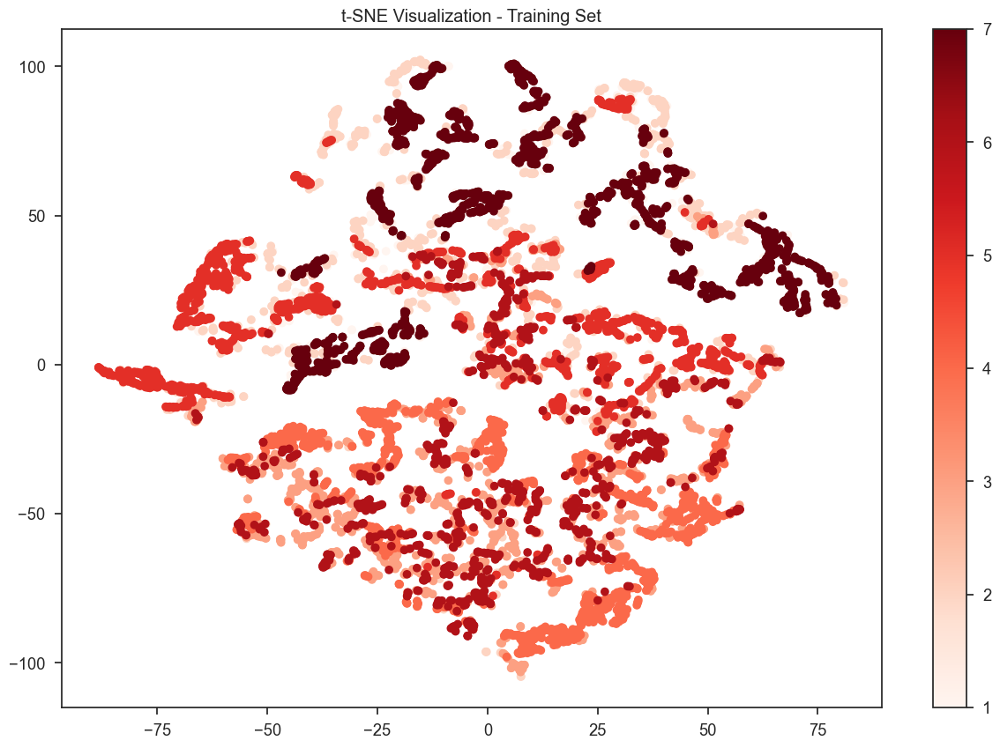

In [42]:
Perform_TSNE(X_train,y_train,"Training Set")

# Run  Function Perform_TSNE For Validation set


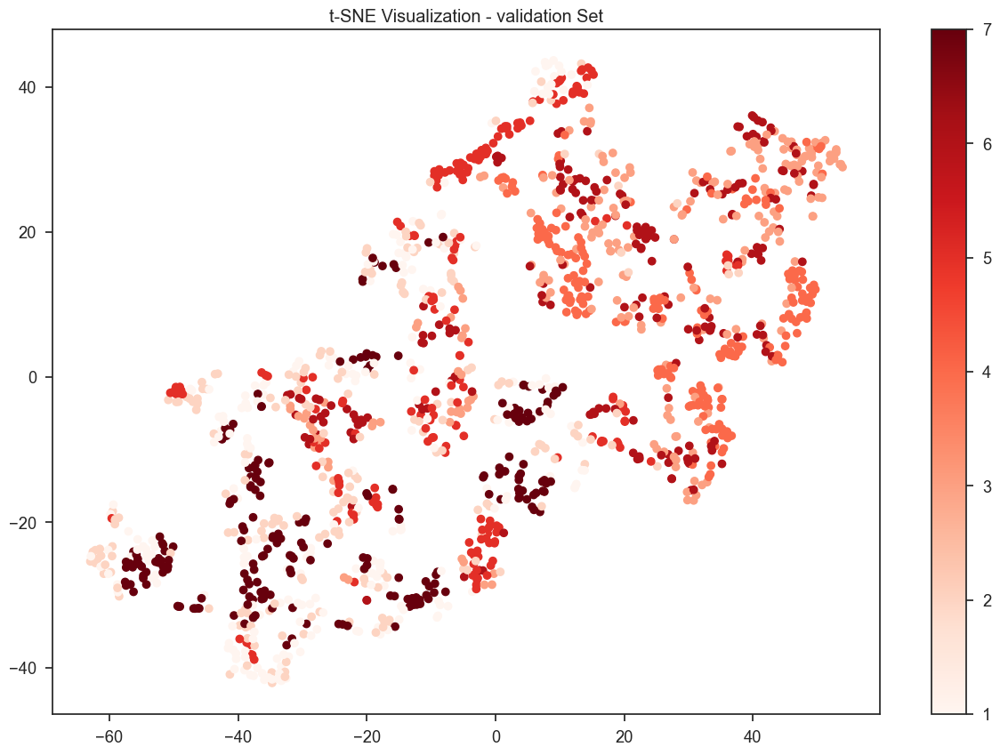

In [43]:
Perform_TSNE(X_validation,y_validation,"validation Set")

# Run  Function Perform_TSNE For Test set


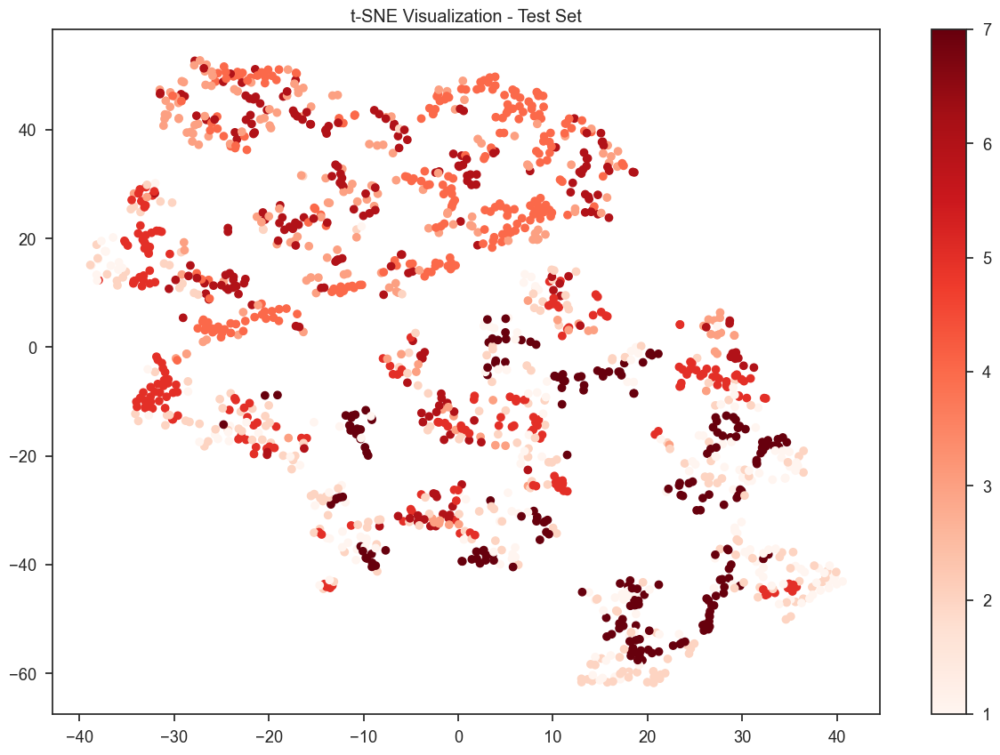

In [44]:
Perform_TSNE(X_test,y_test,"Test Set")

# Q1 

# Obtain a baseline performance

# Function "Naive_Bayes_Models"
* this is user defined function whice apply Naive Bayes models

* It Takes 4 parameters Model_classifier , X__train , Y__train , X__test

* then path X__train and Y__train to fit function then path X__test to predict functoin to calculate classifier_predictions

In [45]:
def Naive_Bayes_Models(classifier,X__train,Y__train,X__test):
    classifier.fit(X__train, Y__train)
    classifier_predictions = classifier.predict(X__test)
    return classifier_predictions

# Function "knn_model"
* this is user defined function whice apply KNN model

* It Takes 4 parameters number of K , X__train , Y__train , X__test

* then path X__train and Y__train to fit function then path X__test to predict functoin to calculate y_test_pred

In [46]:
def knn_model(x_train, y_train, X_test, k):
    knn = KNeighborsClassifier(n_neighbors=k, metric="euclidean")
    knn.fit(x_train, y_train)

    y_test_pred = knn.predict(X_test)
    return y_test_pred

# Function "DecisionTree_model"
* this is user defined function whice apply DecisionTree model

* It Takes 3 parameters number of  X__train , Y__train , X__test

* then path X__train and Y__train to fit function then path X__test to predict functoin to calculate y_test_pred

In [47]:
def DecisionTree_model(x_train, y_train, X_test):

    dt = DecisionTreeClassifier(criterion='entropy',random_state=42)
    dt.fit(x_train, y_train)

    y_pred_entropy = dt.predict(X_test)
    return y_pred_entropy

# Function "svm_model"
* this is user defined function whice apply svm model

* It Takes 3 parameters number of  X__train , Y__train , X__test

* then path X__train and Y__train to fit function then path X__test to predict functoin to calculate y_test_pred

In [48]:
def svm_model(x_train, y_train, X_test):
    svm = SVC(kernel='rbf',random_state=42)
    svm.fit(x_train, y_train)

    y_pred_svm = svm.predict(X_test)
    return y_pred_svm

# Function "LogisticRegressio_model"
* this is user defined function whice apply LogisticRegressio  model

* It Takes 3 parameters number of  X__train , Y__train , X__test

* then path X__train and Y__train to fit function then path X__test to predict functoin to calculate y_test_pred

In [49]:
def LogisticRegressio_model(x_train, y_train, X_test):
    
    logreg = LogisticRegression(solver='liblinear',random_state=42)


    logreg.fit(x_train, y_train)

    y_pred_logreg = logreg.predict(X_test)
    return y_pred_logreg

In [50]:
validation_accuracy  = {}
Test_accuracy  = {}

# Run "knn_model" Function using k=5 for Validation set

In [51]:
y_validation_pred_knn = knn_model(X_train, y_train, X_validation, k=5)

# Display the confusion matrix for KNN classifier and Accurcy scores for Validation set

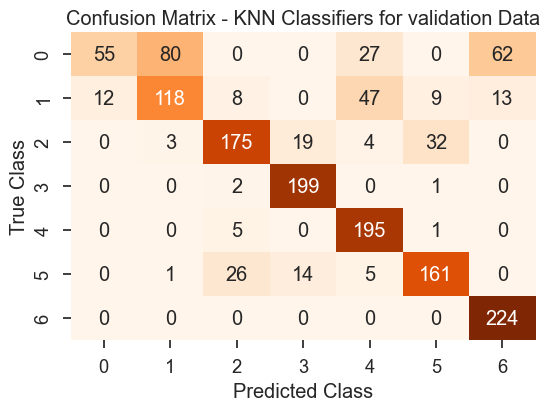

Accuracy:  0.7523364485981309


In [52]:
knn_baseline_validation=conf_matrix(y_validation,y_validation_pred_knn,"KNN Classifiers for validation")

# Run "knn_model" Function using k=5 for test set

In [53]:
y_test_pred_knn = knn_model(X_train, y_train, X_test, k=5)

# Display the confusion matrix for KNN classifier and Accurcy scores for Test set

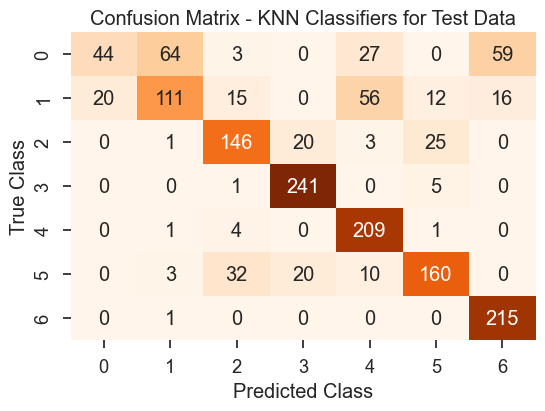

Accuracy:  0.7383606557377049


In [54]:
knn_baseline_Test=conf_matrix(y_test,y_test_pred_knn,"KNN Classifiers for Test")

# Store KNN Validation And Test Accurcy

In [55]:
validation_accuracy ['KNN'] = knn_baseline_validation
Test_accuracy  ['KNN']= knn_baseline_Test

# Run "Classifier_Models" Function using GaussianNB classifier for Validation Set 

In [56]:
Gaussian_validation_predictions=Naive_Bayes_Models(GaussianNB(),X_train,y_train,X_validation)

# Display the confusion matrix for GaussianNB classifier and Accurcy scores for Validation 

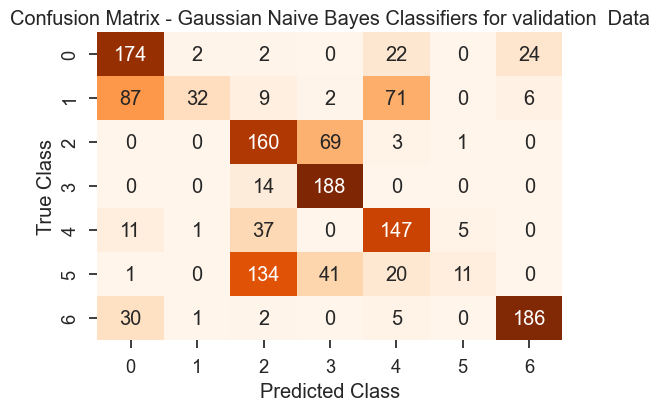

Accuracy:  0.5994659546061415


In [57]:
nb_baseline_validation= conf_matrix(y_validation,Gaussian_validation_predictions,"Gaussian Naive Bayes Classifiers for validation ")

# Run "Classifier_Models" Function using GaussianNB classifier for Test Set 

In [58]:
Gaussian_test_predictions=Naive_Bayes_Models(GaussianNB(),X_train,y_train,X_test)

# Display the confusion matrix for GaussianNB classifier and Accurcy scores for test 

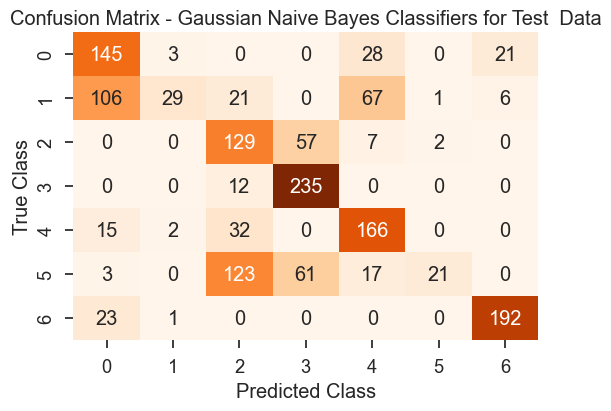

Accuracy:  0.6013114754098361


In [59]:
nb_baseline_Test= conf_matrix(y_test,Gaussian_test_predictions,"Gaussian Naive Bayes Classifiers for Test ")

# Store 'Gaussian Naive Validation And Test Accurcy

In [60]:
validation_accuracy ['Gaussian Naive'] = nb_baseline_validation
Test_accuracy  ['Gaussian Naive']= nb_baseline_Test

# Run "DecisionTree_model" Function using for Validation set

In [61]:
y_validation_pred_DT = DecisionTree_model(X_train, y_train, X_validation)

# Display the confusion matrix for DecisionTree classifier and Accurcy scores for Validation 

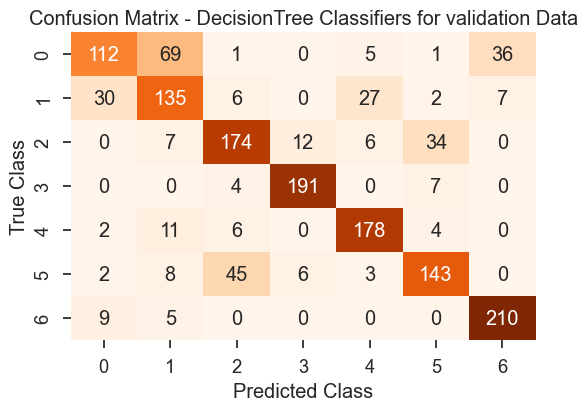

Accuracy:  0.7630173564753004


In [62]:
DT_baseline_validation= conf_matrix(y_validation,y_validation_pred_DT,"DecisionTree Classifiers for validation")

# Run "DecisionTree_model" Function using for Test set

In [63]:
y_test_pred_DT = DecisionTree_model(X_train, y_train, X_test)

# Display the confusion matrix for DecisionTree classifier and Accurcy scores for Test 

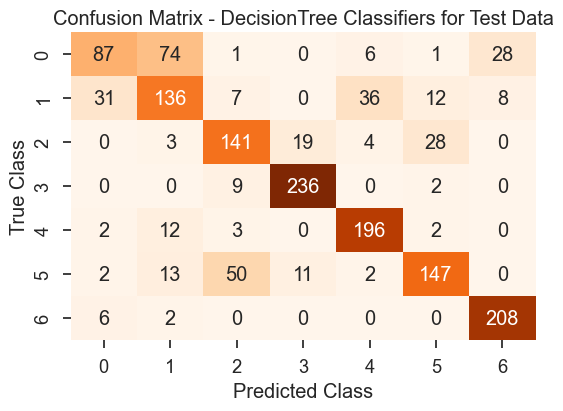

Accuracy:  0.7547540983606558


In [64]:
DT_baseline_Test= conf_matrix(y_test,y_test_pred_DT,"DecisionTree Classifiers for Test")

# Store DecisionTree Validation And Test Accurcy

In [65]:
validation_accuracy ['DecisionTree'] = DT_baseline_validation
Test_accuracy  ['DecisionTree']= DT_baseline_Test

# Run "svm_model" Function using for Validation set

In [66]:
y_validation_pred_SVM = svm_model(X_train, y_train, X_validation)

# Display the confusion matrix for SVM classifier and Accurcy scores for Validation 

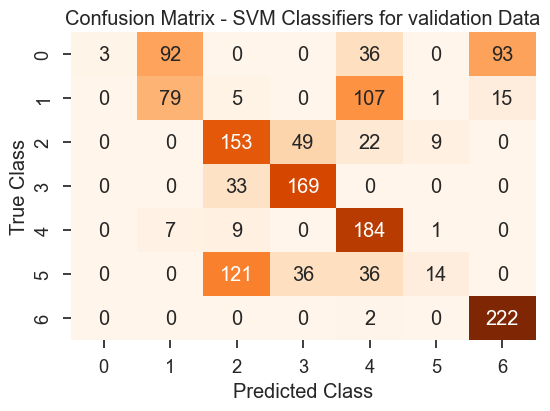

Accuracy:  0.5500667556742324


In [67]:
SVM_baseline_validation= conf_matrix(y_validation,y_validation_pred_SVM,"SVM Classifiers for validation")

# Run "svm_model" Function using for Test set

In [68]:
y_test_pred_SVM = svm_model(X_train, y_train, X_test)

# Display the confusion matrix for SVM classifier and Accurcy scores for test 

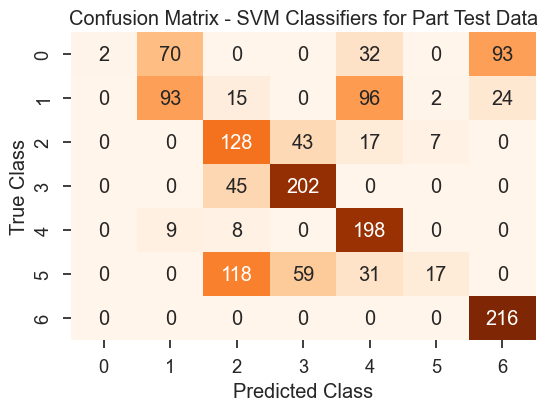

Accuracy:  0.5613114754098361


In [69]:
SVM_baseline_Test= conf_matrix(y_test,y_test_pred_SVM,"SVM Classifiers for Part Test")

# Store SVM Validation And Test Accurcy

In [70]:
validation_accuracy ['SVM'] = SVM_baseline_validation
Test_accuracy  ['SVM']= SVM_baseline_Test

# Run "LogisticRegressio_model" Function using for Validation set

In [71]:
y_validation_pred_logreg = LogisticRegressio_model(X_train, y_train, X_validation)

# Display the confusion matrix for Logistic Regression classifier and Accurcy scores for Validation 

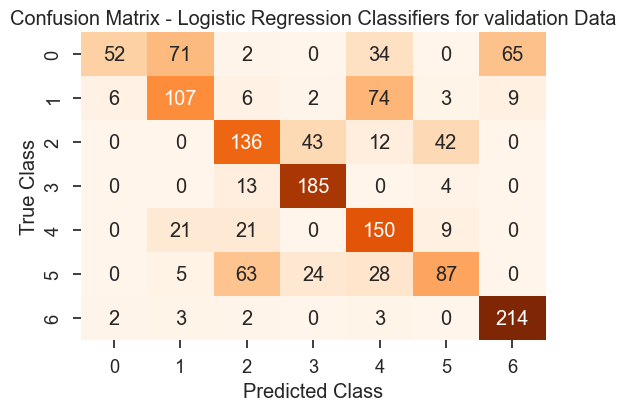

Accuracy:  0.6214953271028038


In [72]:
logreg_baseline_validation= conf_matrix(y_validation,y_validation_pred_logreg,"Logistic Regression Classifiers for validation")

# Run "LogisticRegressio_model" Function using for Test set

In [73]:
y_test_pred_logreg = LogisticRegressio_model(X_train, y_train, X_test)

# Display the confusion matrix for Logistic Regression classifier and Accurcy scores for Test 

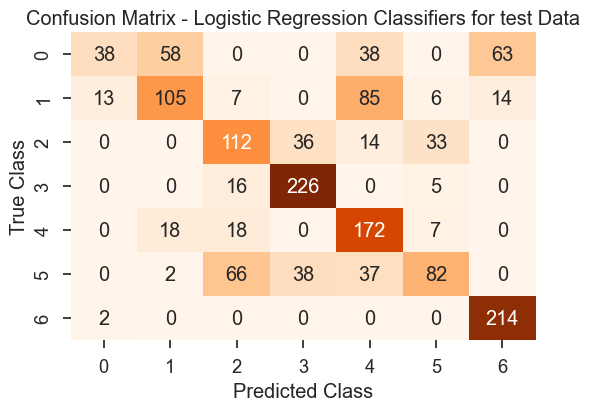

Accuracy:  0.6222950819672131


In [74]:
logreg_baseline_test= conf_matrix(y_test,y_test_pred_logreg,"Logistic Regression Classifiers for test")

# Store Logistic Regression Validation And Test Accurcy

In [75]:
validation_accuracy ['Logistic Regression'] = logreg_baseline_validation
Test_accuracy  ['Logistic Regression']= logreg_baseline_test

# Function plot_bar_chart_baseline
* plot all Models accurcy in a bar-chart as baseline.

In [76]:
def plot_bar_chart_baseline(accuracy_dict,title=None):
    best_model_name = max(accuracy_dict, key=accuracy_dict.get)
    best_model_accuracy = accuracy_dict[best_model_name]

    plt.figure(figsize=(10, 6))
    # Plot the accuracy scores in a bar chart
    bars=plt.bar(accuracy_dict.keys(), accuracy_dict.values(),color='cyan')
    plt.ylim(0, 1)
    plt.xlabel("Models")
    plt.ylabel("Accuracy")
    plt.title(f"Baseline Performance - Accuracy for each ML method for {title}")

    # Add a horizontal line at the highest accuracy
    plt.axhline(y=best_model_accuracy, color='red', linestyle='--', 
                label=f'Highest Accuracy - {best_model_name}: {best_model_accuracy:.3f}')
    plt.legend()

    # Adding accuracy value above each bar
    for bar, accuracy in zip(bars, accuracy_dict.values()):
        plt.text(bar.get_x() + bar.get_width() / 2, bar.get_height(), f"{accuracy:.3f} %", 
                 ha='center', va='bottom', fontsize=12)
    plt.show()

# Run Function plot_bar_chart_baseline for Validation Accuracy


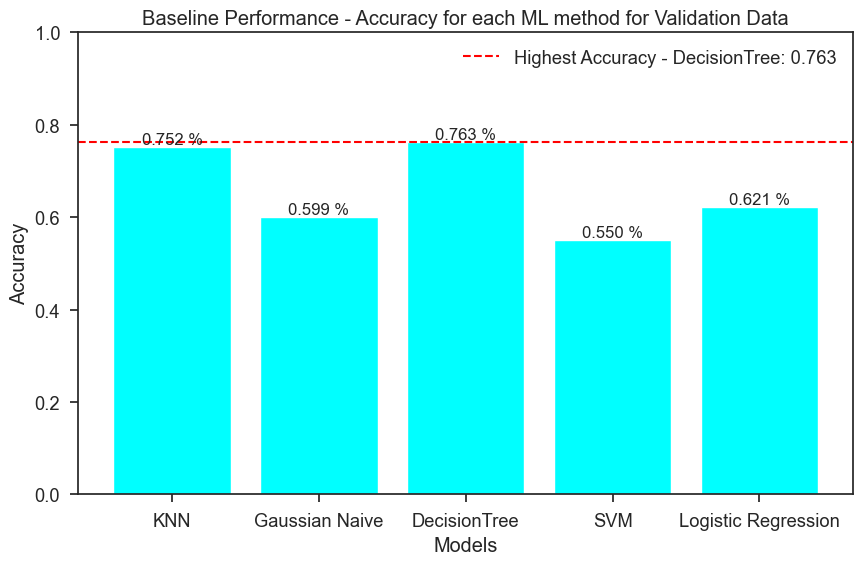

In [77]:
plot_bar_chart_baseline(validation_accuracy,"Validation Data")

# Run Function plot_bar_chart_baseline for Test Accuracy


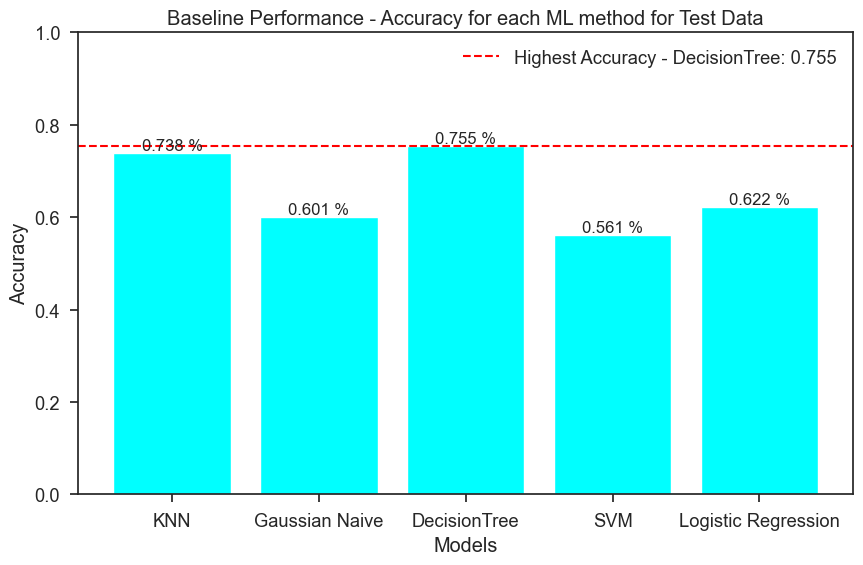

In [78]:
plot_bar_chart_baseline(Test_accuracy,"Test Data")

# As we See The best baseline performance are KNN And Decision Tree

# Q2

# Dimensionality Reduction PCA

In [79]:
# import random

# seed_value = 42
# random.seed(seed_value)

# Function "dimensionality_reduction_PCA"
* this is user defined function whice apply PCA models

* It Takes 4 parameters N_Components , X__train , X_Validation , X__test

* then path X__train to fit function then path X__test and X_Validation to Transform functoin to transform them

In [80]:
def dimensionality_reduction_PCA (x__train,X___Test,X___validation,n_components):
    pca = PCA(n_components=n_components, random_state=0)
    X_train_pca = pca.fit_transform(x__train)
    X_test_pca = pca.transform(X___Test)
    X_validation_pca = pca.transform(X___validation)
    return X_train_pca,X_test_pca,X_validation_pca

# Function "Draw_plots_PCA"
* this is user defined function whice apply plot

* It Takes 3 parameters Accuracy dict ,baseline_accuracy, Title

* then Draw plot "Number of Components" as xlabel ,"ACCURACY" as ylabel



In [81]:
def Draw_plots_PCA(acc_list,baseline_accuracy, Title=None):
    fig = plt.figure()  # Create a new figure
    plt.plot(*zip(*sorted(acc_list.items())))
    plt.axhline(y=baseline_accuracy, color='r', linestyle='--', label=f'Baseline Accuracy {baseline_accuracy:.3f}')
    plt.legend()
    # Title = "Feature Selection with Information Gain Method"
    plt.title(Title, fontsize=16)
    plt.xlabel("Number of Components", fontsize=16)
    plt.ylabel("Accuracy", fontsize=16)
    plt.show()
    print("Maximum accuracy:", max(acc_list.values()))
    print("Best Number of Components:", max(acc_list, key=acc_list.get))
    plt.show()
    # plt.close(fig)

In [82]:
acc_Pca_DT_validation={}
acc_Pca_DT_Test={}
acc_Pca_KNN_validation={}

acc_Pca_KNN_Test={}

# Run dimensionality_reduction_PCA function With Diff N_components For KNN And DecisionTree

In [83]:
for com in range(2,45):
    X_train_pca,X_test_pca,X_validation_pca=dimensionality_reduction_PCA(X_train,X_test,X_validation,com)
    
    
    y_validation_pred_DT = DecisionTree_model(X_train_pca, y_train, X_validation_pca)    
    acc_Pca_DT_validation[com]=calculate_Accuracy(y_validation,y_validation_pred_DT)
    
    y_test_pred_DT = DecisionTree_model(X_train_pca, y_train, X_test_pca)
    acc_Pca_DT_Test[com]=calculate_Accuracy(y_test,y_test_pred_DT)
    
    y_validation_pred_KNN = knn_model(X_train_pca, y_train, X_validation_pca,5)
    acc_Pca_KNN_validation[com]=calculate_Accuracy(y_validation,y_validation_pred_KNN)
    
    y_test_pred_KNN = knn_model(X_train_pca, y_train, X_test_pca,5)    
    acc_Pca_KNN_Test[com]=calculate_Accuracy(y_test,y_test_pred_KNN)
    

In [84]:
X_test_pca.shape

(1525, 44)

# Run Function "Draw_plots_PCA" With DecisionTree for validation

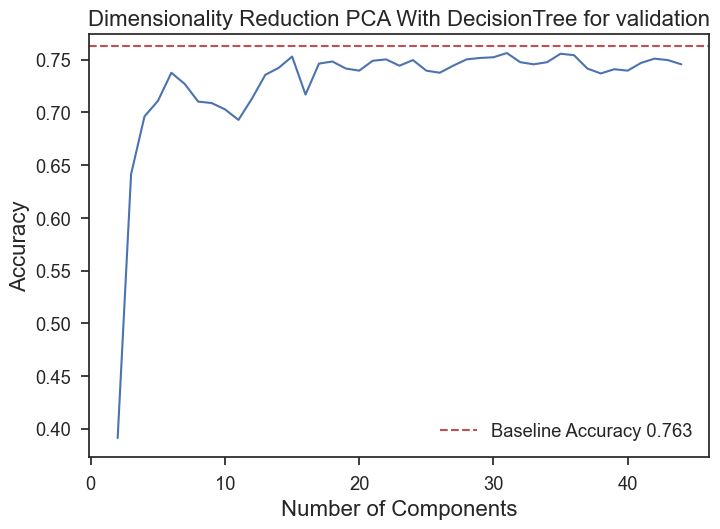

Maximum accuracy: 0.7563417890520694
Best Number of Components: 31


In [85]:
Draw_plots_PCA(acc_Pca_DT_validation,DT_baseline_validation,"Dimensionality Reduction PCA With DecisionTree for validation")


# Run Function "Draw_plots_PCA" With DecisionTree for Test

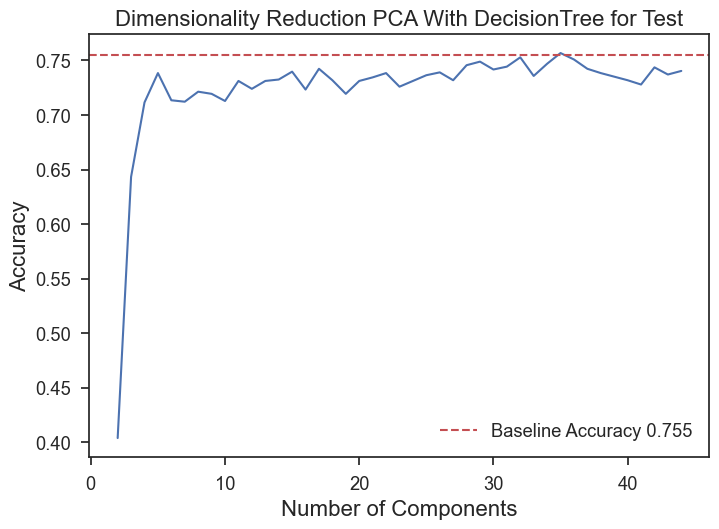

Maximum accuracy: 0.7567213114754099
Best Number of Components: 35


In [86]:
Draw_plots_PCA(acc_Pca_DT_Test,DT_baseline_Test,"Dimensionality Reduction PCA With DecisionTree for Test")


# Run Function "Draw_plots_PCA" With KNN for validation

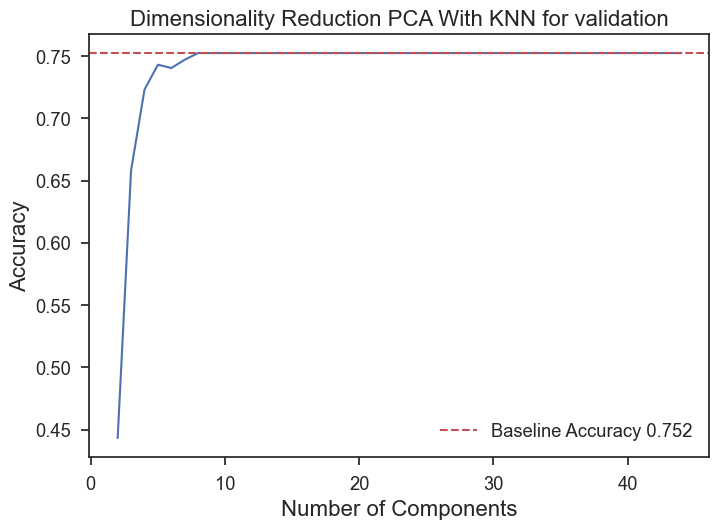

Maximum accuracy: 0.7523364485981309
Best Number of Components: 8


In [87]:
Draw_plots_PCA(acc_Pca_KNN_validation,knn_baseline_validation,"Dimensionality Reduction PCA With KNN for validation")


# Run Function "Draw_plots_PCA" With KNN for Test

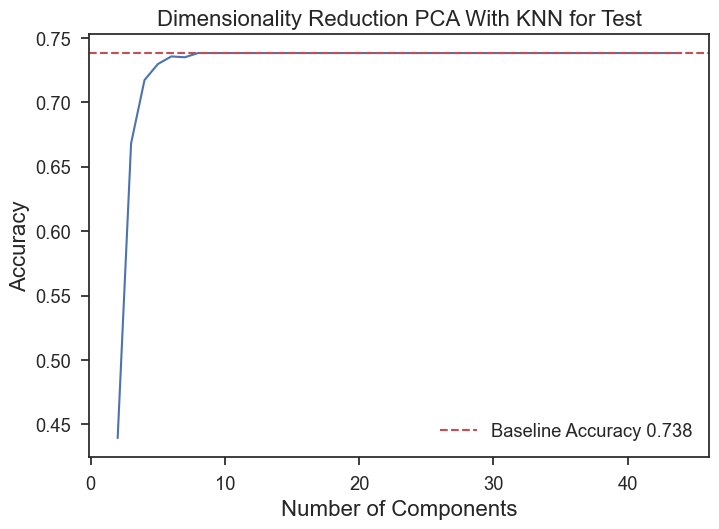

Maximum accuracy: 0.7383606557377049
Best Number of Components: 8


In [88]:
Draw_plots_PCA(acc_Pca_KNN_Test,knn_baseline_Test,"Dimensionality Reduction PCA With KNN for Test")


# Q2

# Feature selection filter based approach

# Function "select_feature"
* this is user defined function whice apply filter based approach using Information Gain

* It Takes 5 parameters N_Components , X__train , X_Validation , X__test, Y_train ,FSM (Method)

* then path X__train and Y_train to fit function then path X__test and X_Validation to Transform functoin to transform them
* Get Feature indices
* Return X_train_new,X_test_new,X_validation_new,feature_indices

In [89]:
def select_feature(X_train, y_train, X_test,X_validation , FSM):
    fs = FSM
    fs.fit(X_train, y_train)
    X_train_new = fs.transform(X_train)
    X_test_new = fs.transform(X_test)
    X_validation_new = fs.transform(X_validation)
    
    feature_indices = fs.get_support(indices=True)
   

    return X_train_new,X_test_new,X_validation_new,feature_indices

In [90]:
acc_dict_DT_validation = {}
acc_dict__DT_Test = {}

acc_dict_KNN_validation = {}
acc_dict_KNN_Test = {}
feature_indices_dict={}

In [91]:
dt = DecisionTreeClassifier(criterion='entropy',random_state=0)



# Run select_feature function With Diff N_Features For KNN And DecisionTree

In [92]:
for k in range(1, 15):

    # Filter method: Information Gain
    fsm = SelectKBest(score_func=mutual_info_classif, k=k)
    
    X_train_new_SBest,X_test_new_SBest,X_validation_new_SBest,feature_indices = select_feature(X_train, y_train, X_test,X_validation, fsm)
    feature_indices_dict[k]=feature_indices
    

    # tree
    
    dt.fit(X_train_new_SBest, y_train)
    y_validation_pred_DT = dt.predict(X_validation_new_SBest)
    acc_dict_DT_validation[k]=calculate_Accuracy(y_validation,y_validation_pred_DT)
    

    y_test_pred_DT = dt.predict(X_test_new_SBest)
    acc_dict__DT_Test[k]=calculate_Accuracy(y_test,y_test_pred_DT)
    
    # KNN
    
    y_validation_pred_KNN = knn_model(X_train_new_SBest, y_train, X_validation_new_SBest,5)
    acc_dict_KNN_validation[k]=calculate_Accuracy(y_validation,y_validation_pred_KNN)

    
    y_test_pred_KNN = knn_model(X_train_new_SBest, y_train, X_test_new_SBest,5)
    acc_dict_KNN_Test[k]=calculate_Accuracy(y_test,y_test_pred_KNN)

# Function "Draw_plots"
* this is user defined function whice apply plot

* It Takes 3 parameters Accuracy dict ,baseline_accuracy, Title

* then Draw plot "Number of Features" as xlabel ,"ACCURACY" as ylabel



In [93]:
def Draw_plots(acc_list,baseline_accuracy, Title=None):
    fig = plt.figure()  # Create a new figure
    plt.plot(*zip(*sorted(acc_list.items())))
    plt.axhline(y=baseline_accuracy, color='r', linestyle='--', label=f'Baseline Accuracy {baseline_accuracy:.3f}')
    plt.legend()
    # Title = "Feature Selection with Information Gain Method"
    plt.title(Title, fontsize=16)
    plt.xlabel("Number of Features", fontsize=16)
    plt.ylabel("Accuracy", fontsize=16)
    plt.show()
    print("Maximum accuracy:", max(acc_list.values()))
    print("Best number of features:", max(acc_list, key=acc_list.get))
    plt.show()
    return   max(acc_list, key=acc_list.get)
    # plt.close(fig)

# Run Function "Draw_plots" With DecisionTree for Validation

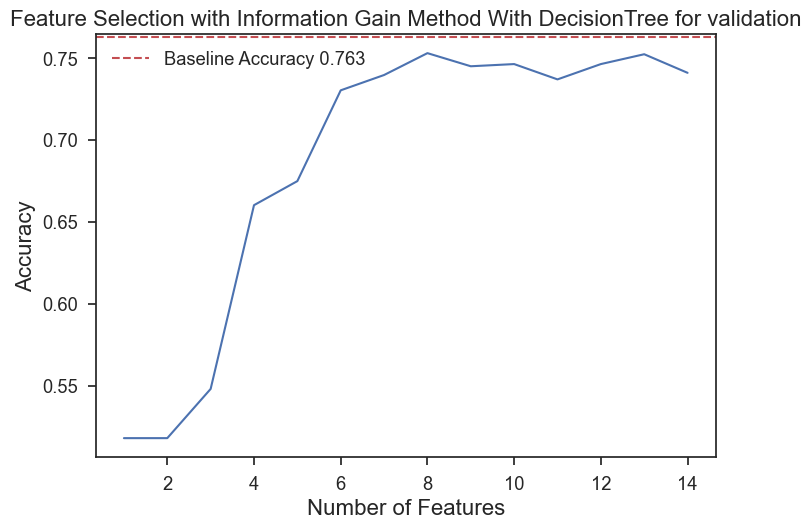

Maximum accuracy: 0.753004005340454
Best number of features: 8


In [94]:
Max_DT_val=Draw_plots(acc_dict_DT_validation,DT_baseline_validation,"Feature Selection with Information Gain Method With DecisionTree for validation")


# Run Function "Draw_plots" With DecisionTree for Test

In [95]:
acc_dict__DT_Test.values()

dict_values([0.519344262295082, 0.520655737704918, 0.5685245901639344, 0.6511475409836066, 0.6675409836065573, 0.7285245901639344, 0.741639344262295, 0.7547540983606558, 0.7501639344262295, 0.7527868852459016, 0.7429508196721312, 0.7508196721311475, 0.7619672131147541, 0.7652459016393443])

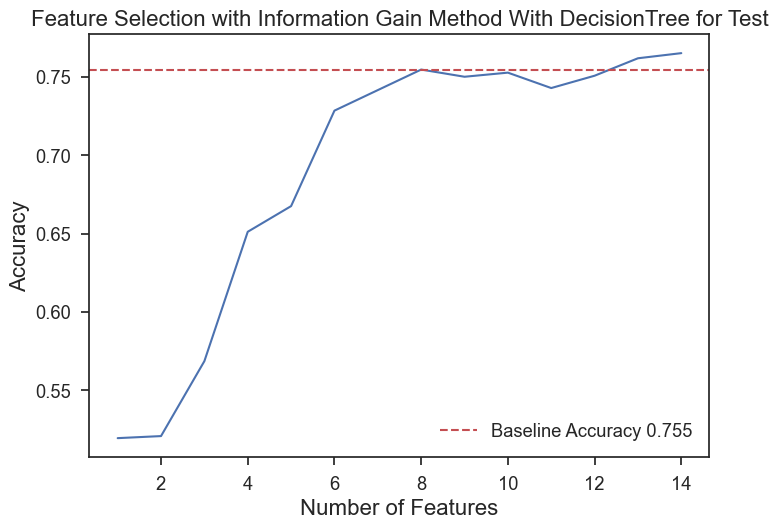

Maximum accuracy: 0.7652459016393443
Best number of features: 14


In [96]:
Max_DT_test=Draw_plots(acc_dict__DT_Test,DT_baseline_Test,"Feature Selection with Information Gain Method With DecisionTree for Test")

# Run Function "Draw_plots" With KNN for Validation

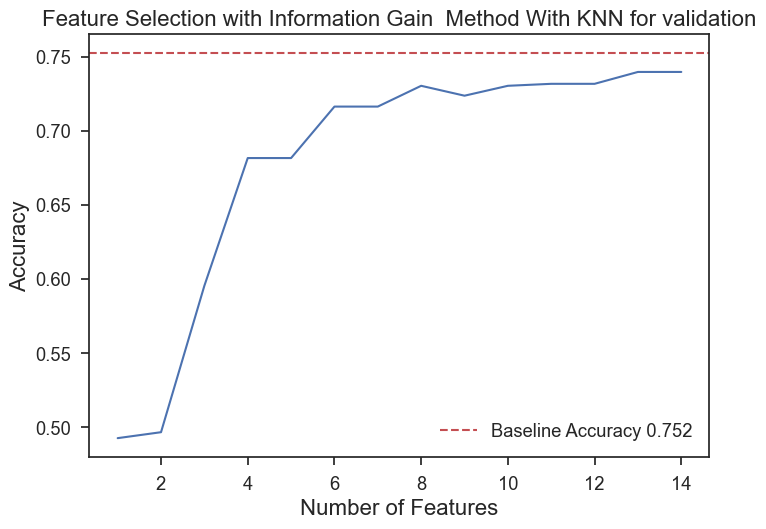

Maximum accuracy: 0.739652870493992
Best number of features: 13


In [97]:
Max_KNN_val=Draw_plots(acc_dict_KNN_validation,knn_baseline_validation,"Feature Selection with Information Gain  Method With KNN for validation")


# Run Function "Draw_plots" With KNN for Test 

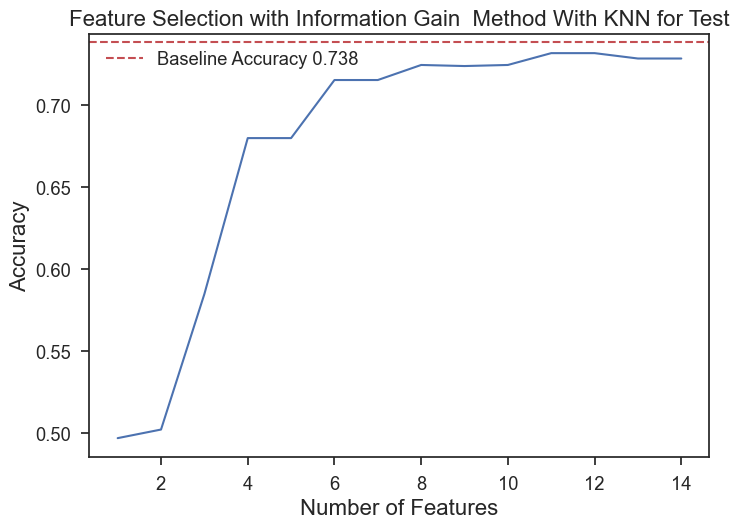

Maximum accuracy: 0.7318032786885246
Best number of features: 11


In [98]:
Max_KNN_test=Draw_plots(acc_dict_KNN_Test,knn_baseline_Test,"Feature Selection with Information Gain  Method With KNN for Test")

# Draw Comparison of Feature Selection Methods Filter Method for KNN and DecisionTree

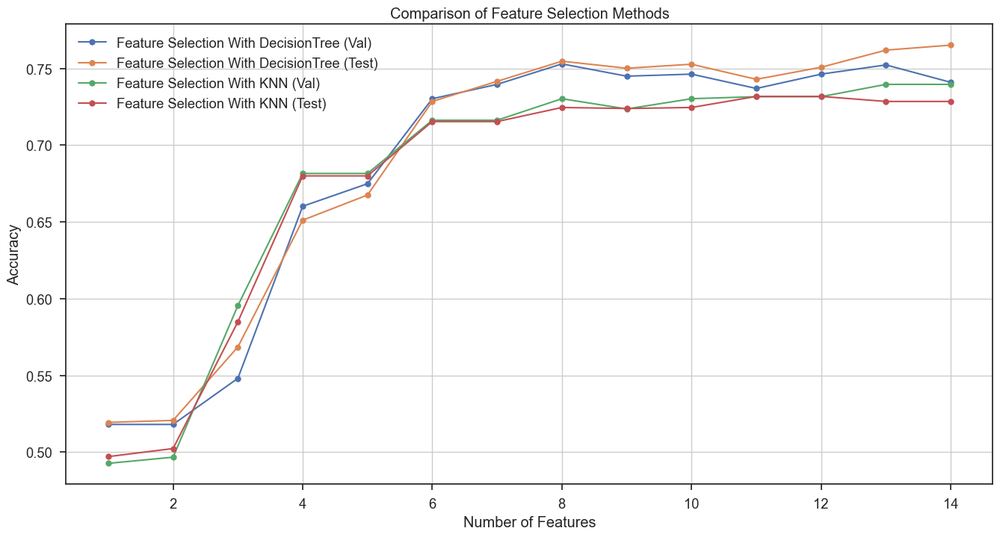

In [99]:
plt.figure(figsize=(16, 8))

plt.plot(*zip(*sorted(acc_dict_DT_validation.items())), marker='o', label='Feature Selection With DecisionTree (Val)')
plt.plot(*zip(*sorted(acc_dict__DT_Test.items())), marker='o', label='Feature Selection With DecisionTree (Test)')
plt.plot(*zip(*sorted(acc_dict_KNN_validation.items())), marker='o', label='Feature Selection With KNN (Val)')
plt.plot(*zip(*sorted(acc_dict_KNN_Test.items())), marker='o', label='Feature Selection With KNN (Test)')

plt.xlabel('Number of Features')
plt.ylabel('Accuracy')
plt.title('Comparison of Feature Selection Methods')
plt.legend()
plt.grid(True)
plt.show()

# Q2

#   Feature selection wrapper based approch

# Function " SequentialFeature"
* this is user defined function whice apply wrapper based approch using forward Sequential

* It Takes 5 parameters n_features_to_select , X__train , Y_train ,MOdel ,forward (Sequential Method)

* then path X__train and Y_train to fit function then Get Feature indices

* Return feature_indices

In [100]:
def SequentialFeature(model, X_train, y_train, n_features_to_select,forward="forward"):
    sfs = SequentialFeatureSelector(model,
                                    n_features_to_select=n_features_to_select,
                                    direction=forward,
#                                     floating=False,
#                                     verbose=0,
                                    scoring='accuracy' )
    sfs.fit(X_train, y_train)
    selected_features_indices = sfs.get_support(indices=True)
#     selected_feature_names = list(sfs.k_feature_names_)
    return selected_features_indices

In [101]:
dt = DecisionTreeClassifier(criterion='entropy',random_state=42)
knn = KNeighborsClassifier(n_neighbors=5, metric="euclidean")
 


# Function " wrapper_feature_selection"
* this is user defined function whice use to Run SequentialFeature function With Diff N_Features For KNN And DecisionTree
​
* It Takes 4 parameters Model , X__train , Y_train ,X_test 
​
* then path X__train and Y_train to SequentialFeature function then Get Feature indices
* then train model with new features
​
* Return test andfeature_indices




In [102]:
def wrapper_feature_selection(Model,x___train,y_train,X____test):
    
    selected_feature_names_dict_A = {}  
    accuracies_model_A_test = {}
    accuracies_model_A_val = {}

    
    
    for k in range(8,16):
        selected_features_indices_A = SequentialFeature(Model, x___train, y_train, k,forward="forward")
        X_train_selected_A = x___train.iloc[:, selected_features_indices_A]
        X_test_selected_A = X____test.iloc[:, selected_features_indices_A]
#         X_validation_selected_A = X_validation.iloc[:, selected_features_indices_A]
    
        selected_feature_names_dict_A[k]=selected_features_indices_A
        
        Model.fit(X_train_selected_A, y_train)
        predictions_test_A = Model.predict(X_test_selected_A)
#         predictions_validation_A= Model.predict(X_validation_selected_A)
        
        accuracies_model_A_test[k]=accuracy_score(y_test, predictions_test_A)
#         accuracies_model_A_val[k]=accuracy_score(y_validation, predictions_validation_A
      
    

    return accuracies_model_A_test,selected_feature_names_dict_A

# Run Function "wrapper_feature_selection" With DecisionTree for Test

In [103]:
accuracies_model_DT,selected_feature_names_dict_DT=wrapper_feature_selection(dt,X_train,y_train,X_test)

# Run Function "wrapper_feature_selection" With KNN for Test

In [104]:
accuracies_model_KNN,selected_feature_names_dict_KNN=wrapper_feature_selection(knn,X_train,y_train,X_test)

# Run Function "Draw_plots" With DecisionTree for Test

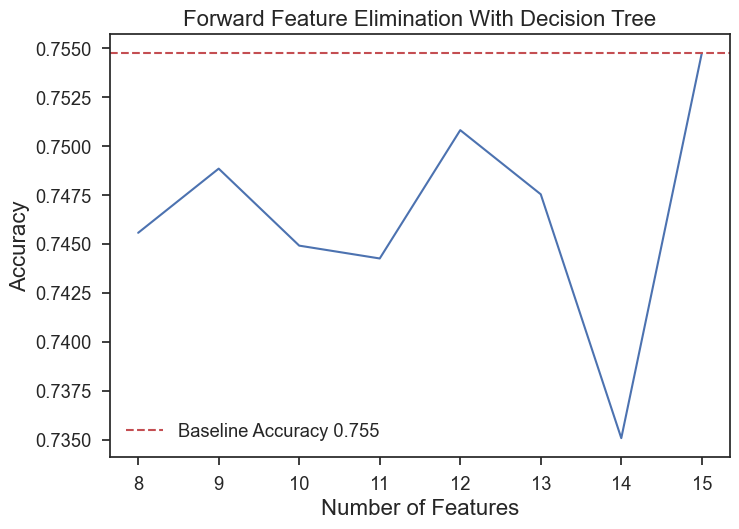

Maximum accuracy: 0.7547540983606558
Best number of features: 15


15

In [105]:
Draw_plots(accuracies_model_DT,DT_baseline_Test,"Forward Feature Elimination With Decision Tree")

# Run Function "Draw_plots" With KNN for Test

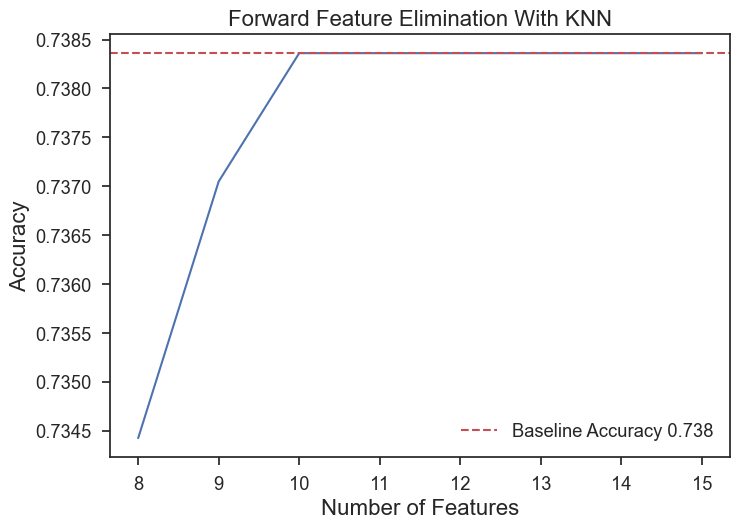

Maximum accuracy: 0.7383606557377049
Best number of features: 10


10

In [106]:
Draw_plots(accuracies_model_KNN,knn_baseline_Test,"Forward Feature Elimination With KNN")

# Now, the best performance  is using Feature selection filter based approach with Decision tree

# Decision tree Featuer indices with test set

In [107]:
Max_DT_test

14

# Function " find_list_with_length "

* this is user defined function whice use to select the best feature from  data after get the best indices from Feature selection
•
* It Takes 3 parameters feature_indices_dict,desired_length,Data
•
* then get feature from feature_indices_dict with length that have higher accuracy
* then select them from data  
•
* Return new selected data

In [108]:
def find_list_with_length(feature_indices_dict,desired_length,Data):
   
    new_features = feature_indices_dict.get(desired_length, None)
    if new_features is not None:
        new_X_train = Data.iloc[:, new_features]
        return new_X_train
    else:
        # Handle the case when the desired_length is not found in the dictionary
        print(f"No list with length {desired_length} found in the dictionary.")
        return None
    

# Run find_list_with_length to  get New X-train and New X_test

In [109]:
X_train_new=find_list_with_length(feature_indices_dict,Max_DT_test,X_train)
X_test_new=find_list_with_length(feature_indices_dict,Max_DT_test,X_test)
X_Validation_new=find_list_with_length(feature_indices_dict,Max_DT_test,X_validation)

X_Validation_new

,Elevation,Aspect,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_9am,Horizontal_Distance_To_Fire_Points,Wilderness_Area1,Wilderness_Area3,Wilderness_Area4,Soil_Type3,Soil_Type10,Soil_Type38,Soil_Type39
0,2432,147,90,2,484,240,1385,0,0,1,0,0,0,0
1,2653,114,175,38,2278,244,2345,0,1,0,0,1,0,0
2,3542,315,255,130,3218,124,1448,1,0,0,0,0,0,0
3,3191,286,30,12,4965,162,781,1,0,0,0,0,0,0
4,2160,64,190,96,240,225,484,0,0,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1493,2062,75,0,0,420,234,691,0,0,1,0,1,0,0
1494,2926,67,324,45,3055,232,2093,1,0,0,0,0,0,0
1495,2595,98,190,0,1883,248,2010,0,1,0,0,0,0,0
1496,2820,257,127,23,2496,183,702,0,1,0,0,0,0,0


# Q3

# Adding more machine learning model 

In [110]:
X_train_new

,Elevation,Aspect,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_9am,Horizontal_Distance_To_Fire_Points,Wilderness_Area1,Wilderness_Area3,Wilderness_Area4,Soil_Type3,Soil_Type10,Soil_Type38,Soil_Type39
0,2976,85,95,72,2436,246,836,0,1,0,0,0,0,0
1,3104,233,150,40,1503,200,1129,0,1,0,0,0,0,0
2,3385,160,937,204,1224,228,752,0,0,0,0,0,0,0
3,3191,41,210,37,3207,221,865,0,1,0,0,0,0,0
4,2821,297,85,1,992,208,242,0,1,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8281,3294,328,624,192,3506,188,3583,0,1,0,0,0,0,0
8282,3390,24,216,13,3332,217,2226,1,0,0,0,0,0,0
8283,3350,100,175,-26,2121,247,3322,1,0,0,0,0,1,0
8284,3727,5,984,318,4934,195,3092,0,1,0,0,0,0,0


In [111]:
More_Model_accuracy={}

# Run DecisionTree_model with X_train_new , X_test_new

In [112]:
y_first_pred_DT = DecisionTree_model(X_train_new, y_train, X_test_new)

# The first improvement is Decision Tree

# Display the confusion matrix for Decision Tree classifier and Accurcy scores for test 

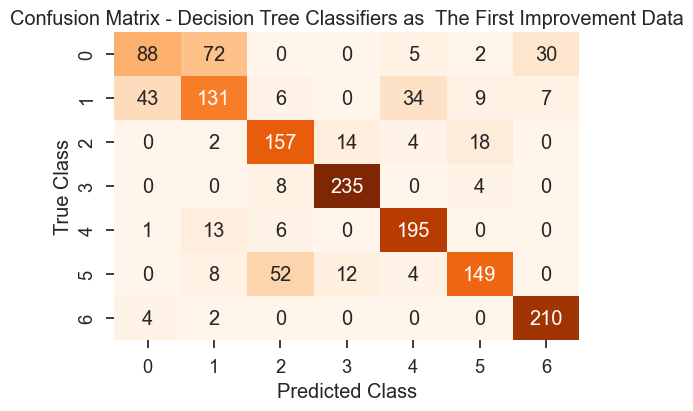

Accuracy:  0.7639344262295082


In [113]:
the_first_improvement=conf_matrix(y_test,y_first_pred_DT,"Decision Tree Classifiers as  The First Improvement")

# Store Decision Tree Accuracy

In [114]:
More_Model_accuracy["Decision Tree"]=the_first_improvement

# Train and evaluate Random Forest classifier

In [115]:
rf_classifier = RandomForestClassifier(n_estimators=100, random_state=42)
rf_classifier.fit(X_train_new, y_train)
rf_predictions = rf_classifier.predict(X_test_new)

# Display the confusion matrix for Random Forest and Accurcy scores for test 

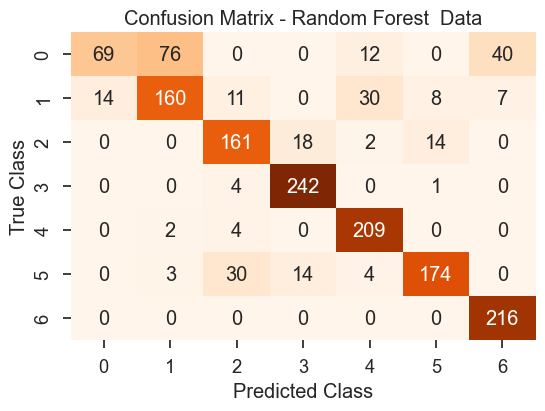

Accuracy:  0.8072131147540984


In [116]:
Random_Forest_ACC=conf_matrix(y_test,rf_predictions,"Random Forest ")

# Store Random Forest Accuracy

In [117]:
More_Model_accuracy["Random Forest"]=Random_Forest_ACC

# Two  ensembles techniques to get better performance.

In [118]:
xgb_clf = xgb.XGBClassifier(random_state=42)
rf_clf = RandomForestClassifier(random_state=42)
GB = GradientBoostingClassifier(random_state=42)

#  Function  "ensmable_techniques"
* use to fit and and Predict ensmable techniques

In [119]:
def ensmable_techniques (x_train , y_train ,x_test ,estimator):
    estimator.fit(x_train, y_train)
    y_pred = estimator.predict(x_test)
    return y_pred

# three estimators for ensmable techniques {XGB - Random Forest - Gradient Boosting }

In [120]:
estimators=[('xgb', xgb_clf), ('rf', rf_clf), ('GB', GB)]

# Run ensmable_techniques function with Voting classifier Estimators 

In [121]:
y_pred_voting = ensmable_techniques(X_train_new , y_train ,X_test_new ,VotingClassifier(estimators=estimators, voting='hard'))

# Display the confusion matrix for Voting classifier Estimators and Accurcy scores for New test 

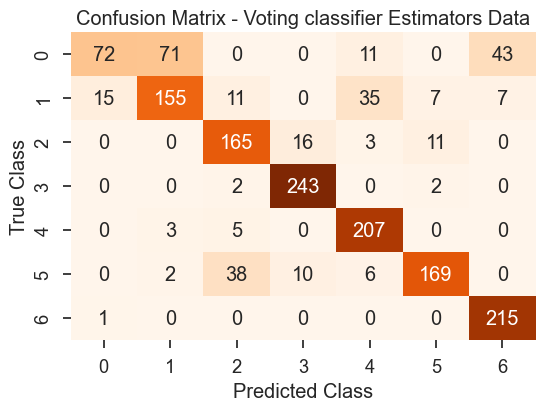

Accuracy:  0.8039344262295082


In [122]:
voting_Accuracy=conf_matrix(y_test,y_pred_voting,"Voting classifier Estimators")

# Store Voting classifier Accuracy

In [123]:
More_Model_accuracy["Voting classifier"]=voting_Accuracy

# Run ensmable_techniques function with Stacking classifier Estimators 

In [124]:
stacking_clf = ensmable_techniques(X_train_new , y_train ,X_test_new ,StackingClassifier(estimators=estimators,
                                  final_estimator=xgb.XGBClassifier(random_state=42)))


# Display the confusion matrix for Stacking Classifier Estimators and Accurcy scores for New test 

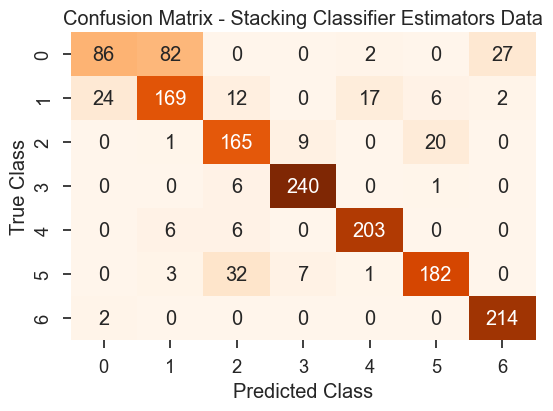

Accuracy:  0.8255737704918032


In [125]:
stacking_Accuracy=conf_matrix(y_test,stacking_clf,"Stacking Classifier Estimators")

# Store Stacking classifier Accuracy

In [126]:
More_Model_accuracy["Stacking classifier"]=stacking_Accuracy

# Run Function plot_bar_chart_baseline for More Model  Test Accuracy

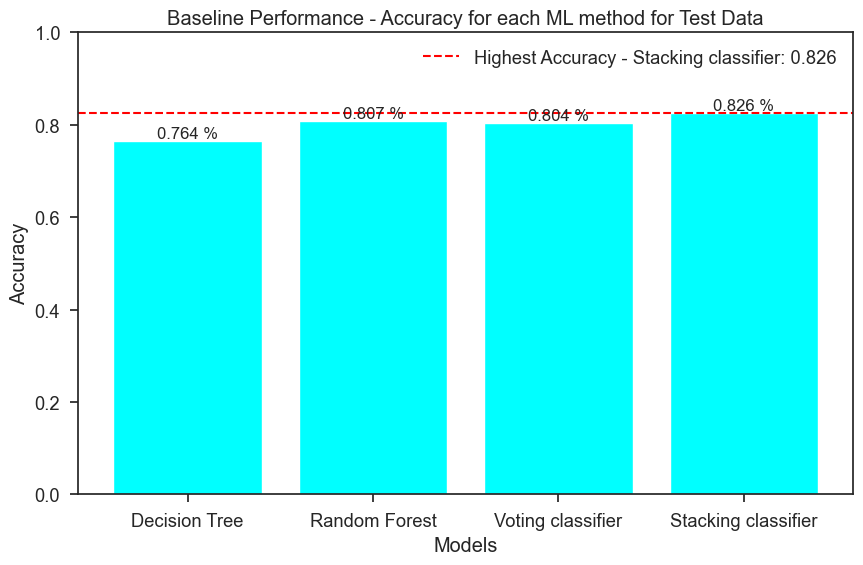

In [127]:
plot_bar_chart_baseline(More_Model_accuracy,"Test Data")

In [128]:
Test_accuracy  ['Logistic Regression']= logreg_baseline_test

# Now , the second improvement is  Stacking Classifier ensmable techniques

In [129]:
the_second_improvement=stacking_Accuracy

# Get predicted target for X_train_new using StackingClassifier 

In [130]:
Y_out_train = ensmable_techniques(X_train_new , y_train ,X_train_new ,StackingClassifier(estimators=estimators,
                                  final_estimator=xgb.XGBClassifier(random_state=42)))

In [131]:
Y_out_val = ensmable_techniques(X_train_new , y_train ,X_Validation_new ,StackingClassifier(estimators=estimators,
                                  final_estimator=xgb.XGBClassifier(random_state=42)))

In [132]:
Y_out_train.shape

(8286,)

In [133]:
Y_out_val.shape

(1498,)

In [134]:
Y_out_train

array([1, 1, 1, ..., 7, 7, 7], dtype=int64)

# Q4

# Supervised & Unsupervised Combination via PKI

#   Function "plot_accuracy_vs_neurons"
* this is user defined function whice apply plot
​
* It Takes 3 parameters grid_sizes, pki_accuracies, second_improvement_accuracy
​
* then Draw plot "Grid Size" as xlabel ,"ACCURACY" as ylabel
​
​

In [144]:
# Step 4: Compare the Best SOFM-PKI Model with the Second Improvement
def plot_accuracy_vs_neurons(grid_sizes, pki_accuracies, second_improvement_accuracy):
    plt.figure(figsize=(8, 6))

    plt.plot([f"{grid_size[0]}x{grid_size[1]}" for grid_size in grid_sizes], pki_accuracies, label='SOFM-PKI Models')
    plt.axhline(y=second_improvement_accuracy, color='red', linestyle='dotted', label='Second Improvement')
    plt.xlabel('Grid Size')
    plt.ylabel('Accuracy')
    plt.title('Grid Size vs  Accuracy')
    plt.grid(True)
    plt.legend()
    plt.show()

# Function " PKI_Model"
* this is user defined function whice Apply PKI model
•
* uses a neural network architecture with several dense layers and a softmax output layer. It also uses the Adam optimizer and categorical cross-entropy loss function for training.

* It Takes 5 parameters som_features_train,y_train,som_features_test,y_test,validation_data
•
* Return test_accuracy, train_accuracy ,Val_accuracy




In [136]:
def PKI_Model(som_features_train,y_train,som_features_test,y_test, validation_data=None):
    
    min_class_label = min(np.min(y_train), np.min(y_test))
    y_train_adjusted = y_train - min_class_label
    y_test_adjusted = y_test - min_class_label

    num_classes = len(np.unique(np.concatenate([y_train_adjusted, y_test_adjusted])))
    y_train_encoded = to_categorical(y_train_adjusted, num_classes=num_classes)
    y_test_encoded = to_categorical(y_test_adjusted, num_classes=num_classes)

    

    pki_model = Sequential()
    pki_model.add(Dense(30, input_dim=som_features_train.shape[1], activation='tanh'))
    pki_model.add(Dense(30, activation='tanh'))
    pki_model.add(Dense(30, activation='tanh'))
    pki_model.add(Dense(30, activation='tanh'))
    pki_model.add(Dense(30, activation='tanh'))
    pki_model.add(Dense(num_classes, activation='softmax'))

 
    adam_optimizer = Adam(learning_rate=0.001)
    pki_model.compile(loss='categorical_crossentropy', optimizer=adam_optimizer, metrics=['accuracy'])
    
    if validation_data is not None:
        som_features_val, y_val = validation_data
        y_val_adjusted = y_val - min_class_label
        y_val_encoded = to_categorical(y_val_adjusted, num_classes=num_classes)
        validation_data = (som_features_val, y_val_encoded)

    history = pki_model.fit(
        som_features_train, y_train_encoded, epochs=50, batch_size=32,
        validation_data=validation_data, verbose=0
    )
    

    
    # Evaluate the model on the train data
    train_loss, train_accuracy = pki_model.evaluate(som_features_train, y_train_encoded)
    # Evaluate the model on the test data
    test_loss, test_accuracy = pki_model.evaluate(som_features_test, y_test_encoded)
    # Evaluate the model on the validation  data
    Val_loss, Val_accuracy = pki_model.evaluate(som_features_val, y_val_encoded)

    return train_accuracy, test_accuracy,Val_accuracy



# Function " train_sofm_pki"
* this is user defined function whice Apply sofm model with PKI


* It Takes 10 parameters X_train, y_train, X_test, y_test,X_val,Y_Val ,Y_out_val,Y_out_train,stacking_clf,grid_size

* then path X_train to winner function to Get the closest cluster for each sample
* then Get lables for X_train,X_test,X_val
* then Marge Y_out_train and cluster_labels_train 
* then Marge Y_out_Test and cluster_labels_Test
* then Marge Y_out_Val and cluster_labels_Val
* then call PKI_Model 







In [137]:
def train_sofm_pki(X_train, y_train, X_test, y_test,X_val,Y_Val ,Y_out_val,Y_out_train,stacking_clf,grid_size,fine_tuning ):
    X_train_np = X_train.values
    X_test_np = X_test.values
    X_Val_np = X_val.values

    som = MiniSom(grid_size[0], grid_size[1], input_len=X_train_np.shape[1], sigma=1.0, learning_rate=0.5,random_seed=42)
    som.random_weights_init(X_train_np)
    num_epochs = 1000  
    som.train_batch(X_train_np, num_epochs,verbose=True)

    

    cluster_labels_train = np.zeros(len(X_train_np), dtype=int)
    for i, x in enumerate(X_train_np):
        distances = np.linalg.norm(x - som.get_weights(), axis=(1, 2))  
        cluster_labels_train[i] = np.argmin(distances)  

    cluster_labels_test = np.zeros(len(X_test_np), dtype=int)
    for i, x in enumerate(X_test_np):
        distances = np.linalg.norm(x - som.get_weights(), axis=(1, 2))  
        cluster_labels_test[i] = np.argmin(distances)  

    cluster_labels_val = np.zeros(len(X_Val_np), dtype=int)
    for i, x in enumerate(X_Val_np):
        distances = np.linalg.norm(x - som.get_weights(), axis=(1, 2)) 
        cluster_labels_val[i] = np.argmin(distances) 


   # Merged Y_out_train from Supervised model And Y_cluster_train from  Unsupervised  model for training dataset
    
    df_train = pd.DataFrame(Y_out_train,columns=["Y_out_train"])
    df1_train= pd.DataFrame(cluster_labels_train,columns=["Y_cluster_train"])
    merged_df_x_train = pd.merge(df_train, df1_train, left_index=True, right_index=True)

    
    
   # Merged Y_out_test from Supervised model And Y_cluster_test from  Unsupervised  model for Test dataset
    
    df = pd.DataFrame(stacking_clf,columns=["Y_out_test"])
    df1= pd.DataFrame(cluster_labels_test,columns=["Y_cluster_test"])
    merged_df_x_test = pd.merge(df, df1, left_index=True, right_index=True)

    # Merged Y_out_Val from Supervised model And Y_cluster_Val from  Unsupervised  model for Test dataset

    df_Val = pd.DataFrame(Y_out_val,columns=["Y_out_Val"])
    df1_val= pd.DataFrame(cluster_labels_val,columns=["Y_cluster_Val"])
    merged_df_x_Val = pd.merge(df_Val, df1_val, left_index=True, right_index=True)
    
    if (fine_tuning):
        return PKI_diff_structures_Model(merged_df_x_train,y_train,merged_df_x_test,y_test,validation_data=(merged_df_x_Val,Y_Val))         
    else:
        return PKI_Model(merged_df_x_train,y_train,merged_df_x_test,y_test,validation_data=(merged_df_x_Val,Y_Val))


# RUN train_sofm_pki with Diff Grid Sizes to get the best Grid size

In [138]:

grid_sizes = [(6, 6), (7, 7), (8, 8), (9, 9), (10, 10), (11, 11), (12, 12)]
best_accuracy = 0
best_sofm_model = None
pki_accuracies = []

for grid_size in grid_sizes:
    train_accuracy, test_accuracy,val= train_sofm_pki(X_train_new, y_train, X_test_new, y_test,X_Validation_new,y_validation,Y_out_val,Y_out_train,stacking_clf, grid_size,False)
#     pki_accuracy=test_accuracy
    pki_accuracies.append(test_accuracy)

    if test_accuracy > best_accuracy:
        best_accuracy = test_accuracy
        
        


 [ 1000 / 1000 ] 100% - 0:00:00 left 
 quantization error: 581.7736228356873


47/47 [==============================] - 0s 934us/step - loss: 1.3592 - accuracy: 0.8324
 [ 1000 / 1000 ] 100% - 0:00:00 left 
 quantization error: 548.8138064608186
47/47 [==============================] - 0s 836us/step - loss: 1.4136 - accuracy: 0.8324
 [ 1000 / 1000 ] 100% - 0:00:00 left 
 quantization error: 514.642274668352
47/47 [==============================] - 0s 888us/step - loss: 1.4626 - accuracy: 0.8324
 [ 1000 / 1000 ] 100% - 0:00:00 left 
 quantization error: 506.46956595821547
47/47 [==============================] - 0s 884us/step - loss: 1.4281 - accuracy: 0.8324
 [ 1000 / 1000 ] 100% - 0:00:00 left 
 quantization error: 492.87819328751453
47/47 [==============================] - 0s 846us/step - loss: 1.4278 - accuracy: 0.8324
 [ 1000 / 1000 ] 100% - 0:00:00 left 
 quantization error: 477.43634746886545
47/47 [==============================] - 0s 875us/step - loss: 1.4112 - accuracy: 0.8324
 [ 1000 / 1000 ] 100% - 0:00:00 left 
 quantization error: 435.0633554934348
47

In [139]:
best_accuracy

0.825573742389679

# Display plot for accuracy vs Grid size  for Som

TypeError: float() argument must be a string or a number, not 'dict'

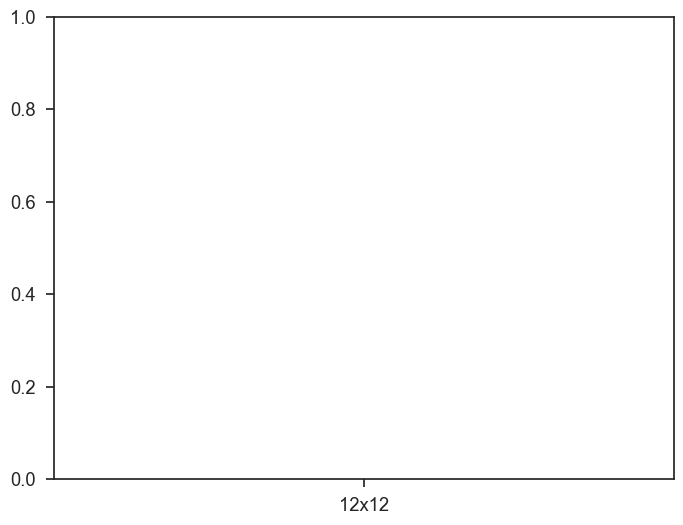

In [145]:
plot_accuracy_vs_neurons(grid_sizes, pki_accuracies, the_second_improvement)

# Run SOM model with the Best Grid size 

In [141]:
grid_sizes = [(12, 12)]
best_accuracy = 0
best_sofm_model = None
# pki_accuracies = []

for grid_size in grid_sizes:
    train_accuracy, test_accuracy,val= train_sofm_pki(X_train_new, y_train, X_test_new, y_test,X_Validation_new,y_validation,Y_out_val,Y_out_train,stacking_clf, grid_size,False)
        



 [  980 / 1000 ]  98% - 0:00:00 left 

 [ 1000 / 1000 ] 100% - 0:00:00 left 
 quantization error: 435.0633554934348
47/47 [==============================] - 0s 868us/step - loss: 1.3658 - accuracy: 0.8324


# Q5

# Applying parameter fine tuning to get better performance from the previous best performance

In [142]:
def PKI_diff_structures_Model(som_features_train, y_train, som_features_test, y_test, validation_data=None):
    min_class_label = min(np.min(y_train), np.min(y_test))
    y_train_adjusted = y_train - min_class_label
    y_test_adjusted = y_test - min_class_label

    num_classes = len(np.unique(np.concatenate([y_train_adjusted, y_test_adjusted])))
    y_train_encoded = to_categorical(y_train_adjusted, num_classes=num_classes)
    y_test_encoded = to_categorical(y_test_adjusted, num_classes=num_classes)

    hidden_layers_list = [ 2, 5, 6, 7]  # Try different numbers of hidden layers
    neurons_per_layer_list = [8,16, 32, 64, 128]  # Try different numbers of neurons per layer
    learning_rates = [0.01, 0.001, 0.0001]

    best_accuracy_so_far = 0.0
    best_hyperparameters = None
    test_accuracies = []

    if validation_data is not None:
        som_features_val, y_val = validation_data
        y_val_adjusted = y_val - min_class_label
        y_val_encoded = to_categorical(y_val_adjusted, num_classes=num_classes)
        validation_data = (som_features_val, y_val_encoded)

    for lr in learning_rates:
        for num_hidden_layers in hidden_layers_list:
            for num_neurons_per_layer in neurons_per_layer_list:
                pki_model = Sequential()
                pki_model.add(Dense(num_neurons_per_layer, input_dim=som_features_train.shape[1], activation='tanh'))
                for _ in range(num_hidden_layers - 1):
                    pki_model.add(Dense(num_neurons_per_layer, activation='tanh'))
                pki_model.add(Dense(num_classes, activation='softmax'))

                adam_optimizer = Adam(learning_rate=lr)
                pki_model.compile(loss='categorical_crossentropy', optimizer=adam_optimizer, metrics=['accuracy'])

                history = pki_model.fit(som_features_train, y_train_encoded, epochs=50, batch_size=32, validation_data=validation_data, verbose=0)

                # Evaluate the model on the test data
                _, accuracy_test = pki_model.evaluate(som_features_test, y_test_encoded)
                test_accuracies.append(accuracy_test) 

                if accuracy_test > best_accuracy_so_far:
                    best_accuracy_so_far = accuracy_test
                    best_hyperparameters = {
                        'learning_rate': lr,
                        'num_hidden_layers': num_hidden_layers,
                        'num_neurons_per_layer': num_neurons_per_layer
                    }
    best_accuracy_index = np.argmax(test_accuracies)
    best_accuracy = test_accuracies[best_accuracy_index]
    plt.figure(figsize=(10, 6))
    plt.plot(range(len(test_accuracies)), test_accuracies, '-o', color='b', label="Model Performance")
    plt.plot(best_accuracy_index, best_accuracy, 'ro', markersize=8, label="The Model's Best Accuracy")
    plt.axhline(y=the_second_improvement, color='red', linestyle='--', label='Baseline Performance')
    plt.xticks(range(len(test_accuracies)), range(len(test_accuracies)))
    plt.xlabel('Model Fine-Tuning Iteration')
    plt.ylabel('Test Accuracy')
    plt.title(f'Best Accuracy: {best_accuracy_so_far:.4f} with Parameters: {best_hyperparameters}')
    plt.legend()
    plt.show()

    return best_hyperparameters


# Run SOM model with fine tuning to get better performance from the previous best performance

 [ 1000 / 1000 ] 100% - 0:00:00 left 


 quantization error: 435.0633554934348
48/48 [==============================] - 0s 952us/step - loss: 1.5691 - accuracy: 0.8256


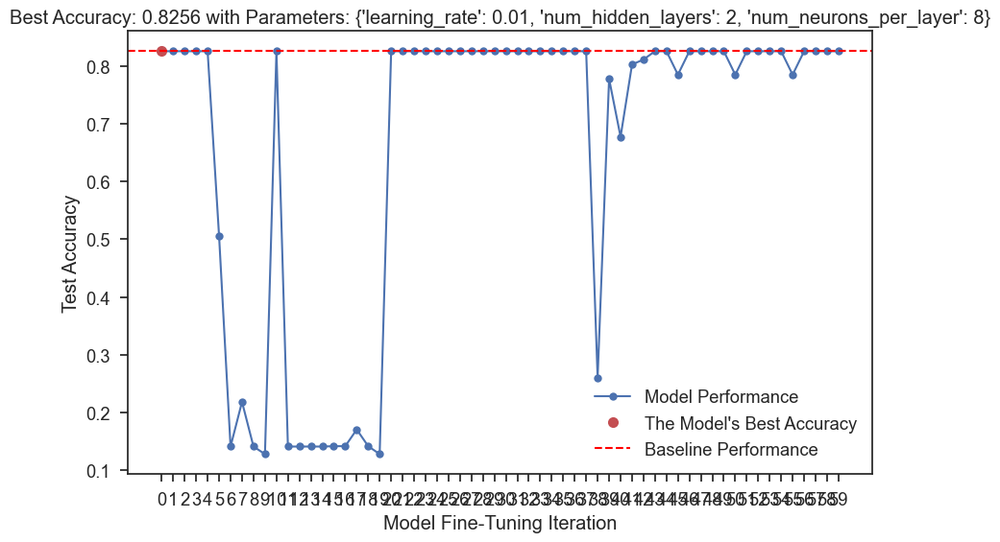

In [143]:

grid_sizes = [ (12, 12)]
best_accuracy = 0
best_sofm_model = None
pki_accuracies = {}

for grid_size in grid_sizes:
    f=train_sofm_pki(X_train_new, y_train, X_test_new, y_test,X_Validation_new,y_validation,Y_out_val,Y_out_train,stacking_clf, grid_size,True)

    pki_accuracies[grid_size]=f
    

        
